This project aims to use machine learning to predict automobile insurance fraud.

I used multiple models in order to solve this problem, and overcame challenges such as imbalanced data and lots of unimportant features. At the end, I was able to come up with a profile for fraud and specific characteristics to look for in automobile insurance claims that might indicate fraud.

In [1]:
import pandas as pd
pd.options.display.max_columns = 100
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats 
import seaborn as sns
sns.set_palette('muted')
import math

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
import tensorflow.keras as tfk

from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize

import warnings
warnings.filterwarnings('ignore')
import time

### NOTE: Do not 'run all,' you will probably run out of memory!

/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
# https://www.yields.io/news/hackathon
# Competition data for employees of yields for a hackathon they hosted. It is a nice, easy to use, labeled
# dataset for finding insurance fraud.
raw_data = pd.read_csv('/Users/jdobrow/Desktop/Data Science/Insurance/insurance_fraud_train.csv', index_col=0)
raw_data.reset_index(inplace=True, drop=True)
raw_data.head()

,IncidentMonth,IncidentWeekOfMonth,IncidentDayOfWeek,Make,IncidentAddressType,DeclarationDayOfWeek,DeclarationMonth,DeclarationWeekOfMonth,DriverGender,DriverMaritalStatus,DriverAge,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound,PolicyNumber,RepairerDetailID,Deductible,DriverRating,DaysPolicyAccident,DaysPolicyClaim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChangeClaim,NumberOfCars,IncidentYear,BasePolicy
0,Sep,4,Monday,Mazda,Urban,Tuesday,Oct,2,Male,Married,76,Third Party,Sedan - All Perils,Sedan,20000 to 29000,0,6084,2,400,2,more than 30,more than 30,2 to 4,more than 7,over 65,No,No,External,none,no change,1 vehicle,1994,All Perils
1,Mar,3,Friday,Chevrolet,Rural,Wednesday,Mar,4,Male,Married,80,Policy Holder,Sedan - All Perils,Sedan,30000 to 39000,0,348,5,400,3,more than 30,more than 30,none,more than 7,over 65,No,No,External,more than 5,no change,1 vehicle,1994,All Perils
2,Jan,3,Monday,Pontiac,Urban,Tuesday,Jan,3,Male,Married,57,Third Party,Sedan - All Perils,Sedan,20000 to 29000,0,12078,12,400,1,more than 30,more than 30,2 to 4,more than 7,51 to 65,No,No,External,none,no change,1 vehicle,1996,All Perils
3,Jun,4,Monday,Mazda,Urban,Wednesday,Jun,5,Male,Married,55,Policy Holder,Sedan - Liability,Sport,20000 to 29000,0,13480,11,400,4,more than 30,more than 30,2 to 4,more than 7,41 to 50,No,No,External,1 to 2,no change,1 vehicle,1996,Liability
4,Jul,4,Saturday,Honda,Urban,Thursday,Aug,2,Male,Married,39,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,1364,10,400,1,more than 30,more than 30,2 to 4,more than 7,36 to 40,No,No,External,none,no change,1 vehicle,1994,Collision


In [3]:
### Data Cleaning and Exploratory Data Analysis ###
# I need to get all input variables to numeric for modeling and clustering.
# This will mostly be done by creating dummy variables
clean_df = raw_data.copy()
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11565 entries, 0 to 11564
Data columns (total 33 columns):
IncidentMonth             11565 non-null object
IncidentWeekOfMonth       11565 non-null int64
IncidentDayOfWeek         11565 non-null object
Make                      11565 non-null object
IncidentAddressType       11565 non-null object
DeclarationDayOfWeek      11565 non-null object
DeclarationMonth          11565 non-null object
DeclarationWeekOfMonth    11565 non-null int64
DriverGender              11565 non-null object
DriverMaritalStatus       11565 non-null object
DriverAge                 11565 non-null int64
Fault                     11565 non-null object
PolicyType                11565 non-null object
VehicleCategory           11565 non-null object
VehiclePrice              11565 non-null object
FraudFound                11565 non-null int64
PolicyNumber              11565 non-null int64
RepairerDetailID          11565 non-null int64
Deductible                11565 n

In [4]:
# --- Data Cleaning ---

# There are some makes with too few entries, and they're all
# expensive cars so I combined them into one category.
make_list = []
luxury_cars = ['Jaguar', 'BMW', 'Porche', 'Mecedes', 'Ferrari']
for i in clean_df.Make:
    make_list.append('Luxury') if i in luxury_cars else make_list.append(i)
clean_df['Make'] = make_list

# There's one random error here, setting it to mode.
dec_day = []
for day in clean_df.DeclarationDayOfWeek:
    dec_day.append('Monday') if day == '0' else dec_day.append(day)
clean_df['DeclarationDayOfWeek'] = dec_day

# Same issue here. Mode is January
months = []
for month in clean_df.DeclarationMonth:
    months.append('Jan') if month == '0' else months.append(month)
clean_df['DeclarationMonth'] = months

# Each of the claims with driver age at 0 also has a policy holder 
# age of 16 to 17. I suspect that this means the drivers are also 
# 16 to 17, so I will set them all to 16.
ages = []
for age in clean_df.DriverAge:
    ages.append(16) if age < 16 else ages.append(age)
clean_df['DriverAge'] = ages

# This is just a combination of two other variables.
clean_df.drop('PolicyType', 1, inplace=True)

# This is just another index basically
clean_df.drop('PolicyNumber', 1, inplace=True)

# I want to make dummy variables out of these since they're categorical
clean_df['RepairerDetailID'] = clean_df['RepairerDetailID'].astype(str)
clean_df['DriverRating'] = clean_df['DriverRating'].astype(str)
clean_df['IncidentWeekOfMonth'] = clean_df['IncidentWeekOfMonth'].astype(str)
clean_df['DeclarationWeekOfMonth'] = clean_df['DeclarationWeekOfMonth'].astype(str)
clean_df['Deductible'] = clean_df['Deductible'].astype(str)
clean_df['IncidentYear'] = clean_df['IncidentYear'].astype(str)

# Only 3 entries 'under 6 months' so I will just combine it to the 
# 1 year category.
changes = []
for change in clean_df.AddressChangeClaim:
    changes.append('1 year') if change == 'under 6 months' else changes.append(change)
clean_df['AddressChangeClaim'] = changes

# Only 2 entries in 'more than 8'
num_cars = []
for i in clean_df.NumberOfCars:
    num_cars.append('5 to 8') if i == 'more than 8' else num_cars.append(i)
clean_df['NumberOfCars'] = num_cars

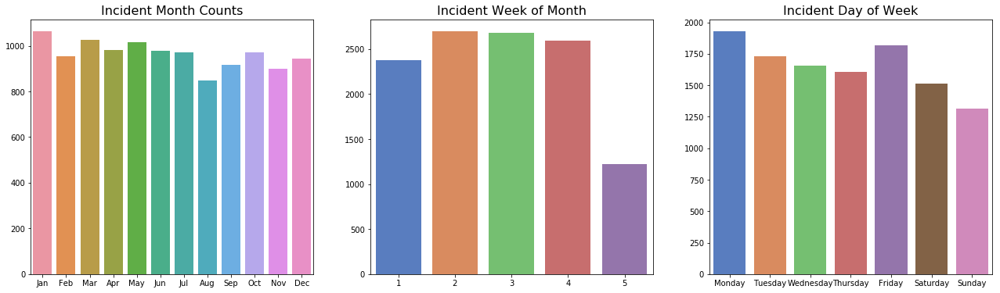

In [5]:
# --- Time Related Stats ---

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
        'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
weeks = [1,2,3,4,5]
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 
        'Friday', 'Saturday', 'Sunday']
month_count, week_count, day_count = [], [], []
for month in months:
    month_count.append(len(raw_data[raw_data.IncidentMonth == month]))
for week in weeks:
    week_count.append(len(raw_data[raw_data.IncidentWeekOfMonth == week]))
for day in days:
    day_count.append(len(raw_data[raw_data.IncidentDayOfWeek == day]))
    
fig, axes = plt.subplots(1,3, figsize=(22,6))
sns.barplot(months, month_count, ax=axes[0])
sns.barplot(weeks, week_count, ax=axes[1])
sns.barplot(days, day_count, ax=axes[2])
axes[0].set_title('Incident Month Counts', fontsize=16)
axes[1].set_title('Incident Week of Month', fontsize=16)
axes[2].set_title('Incident Day of Week', fontsize=16)
plt.show()

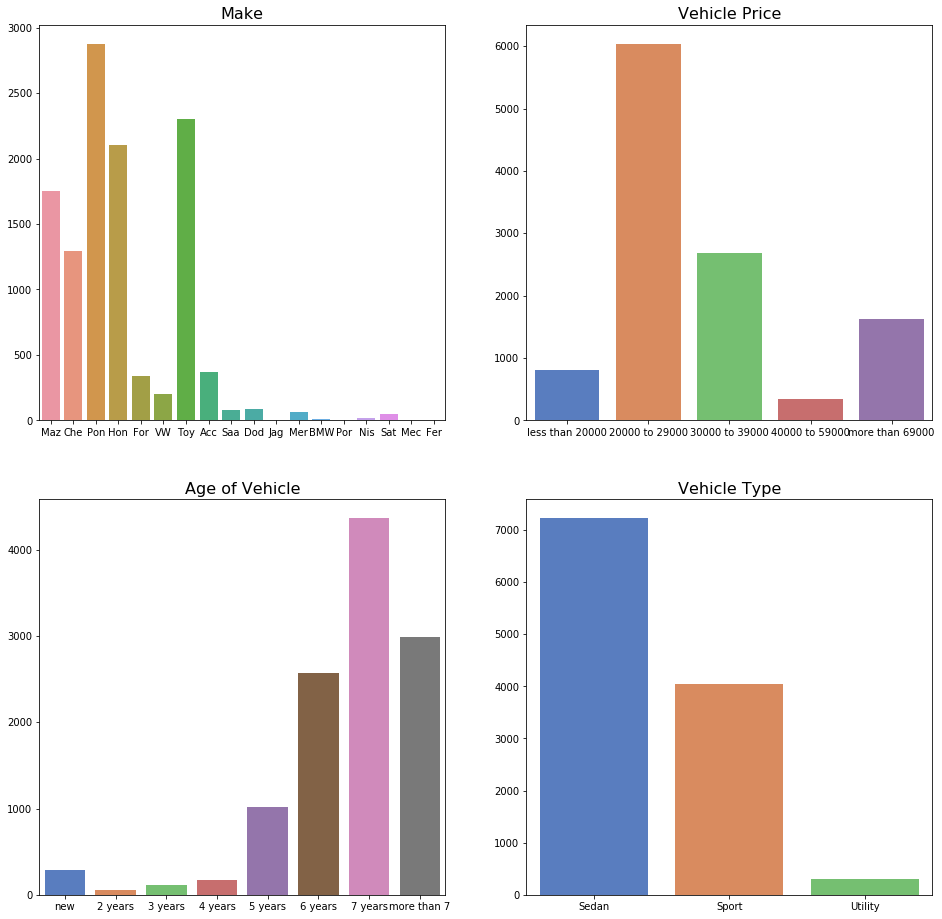

In [45]:
# --- Vehicle stats ---
# We have a few small categories here, and they all seem to be 
# luxury car makers. Note: Mercedes is misspelled in this dataset. 
# So is the variable 'Supplements.' I just left them as is.
# I suspect that this dataset has a higher average price than the
# United States average, as well as a very different distrubution of
# car makes. There are a lot of Pontiacs in this dataset for example.

prices = ['less than 20000', '20000 to 29000', '30000 to 39000', 
          '40000 to 59000', 'more than 69000']
ages = ['new', '2 years', '3 years', '4 years', '5 years', 
        '6 years', '7 years', 'more than 7']
name_list, make_count, price_count, age_count, cat_count = [], [], [], [], []

for make in raw_data.Make.unique():
    make_count.append(len(raw_data[raw_data.Make == make]))
    name_list.append(make[:3])
for price in prices:
    price_count.append(len(raw_data[raw_data.VehiclePrice == price]))
for age in ages:
    age_count.append(len(clean_df[raw_data.AgeOfVehicle == age]))
for cat in raw_data.VehicleCategory.unique():
    cat_count.append(len(raw_data[raw_data.VehicleCategory == cat]))

fig, axes = plt.subplots(2,2, figsize=(16, 16))
sns.barplot(name_list, make_count, ax=axes[0, 0])
sns.barplot(prices, price_count, ax=axes[0, 1])
sns.barplot(ages, age_count, ax=axes[1, 0])
sns.barplot(raw_data.VehicleCategory.unique(), cat_count, ax=axes[1, 1])
axes[0, 0].set_title('Make', fontsize=16)
axes[0, 1].set_title('Vehicle Price', fontsize=16)
axes[1, 0].set_title('Age of Vehicle', fontsize=16)
axes[1, 1].set_title('Vehicle Type', fontsize=16)
plt.show()

In [46]:
# --- Demographic Stats ---

ratings, rating_count, stat_count = ['1', '2', '3', '4'], [], []
for status in clean_df.DriverMaritalStatus.unique():
    stat_count.append(len(clean_df[clean_df.DriverMaritalStatus == status]))
for rating in ratings:
    rating_count.append(len(clean_df[clean_df.DriverRating == rating]))

fig, axes = plt.subplots(2,2, figsize=(16,16))
axes[0, 0].pie(clean_df.groupby('DriverGender')['DriverGender'].count(), labels=['Female', 'Male'])
sns.barplot(clean_df.DriverMaritalStatus.unique(), stat_count, ax=axes[0, 1])
sns.distplot(clean_df.DriverAge, bins=30, ax=axes[1, 0])
sns.barplot(ratings, rating_count, ax=axes[1, 1])

axes[0, 0].legend(fontsize=14)
axes[1, 0].set_xlabel('Mean: {}'.format(round(np.mean(clean_df.DriverAge),2)), fontsize=14)
axes[0, 0].set_title('Driver Gender', fontsize=16)
axes[0, 1].set_title('Driver Marital Status', fontsize=16)
axes[1, 0].set_title('Driver Age', fontsize=16)
axes[1, 1].set_title('Driver Rating', fontsize=16)
plt.show()

AttributeError: 'DataFrame' object has no attribute 'DriverMaritalStatus'

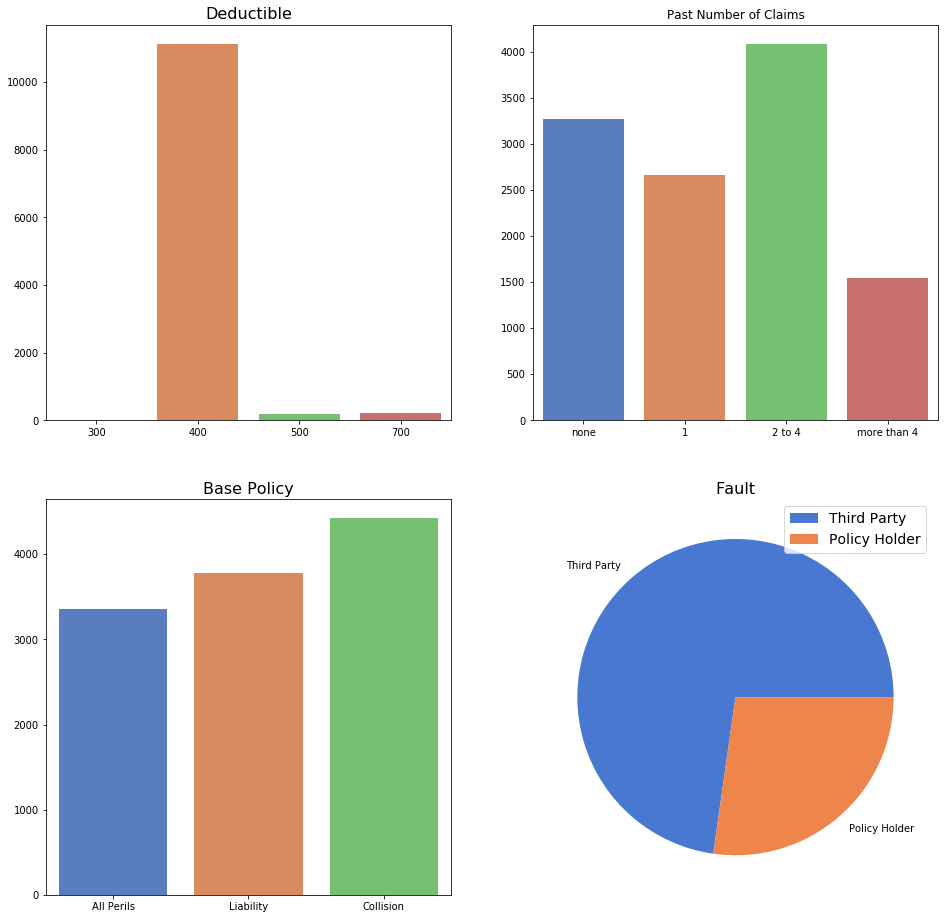

In [8]:
# --- Terms of the Policy and Claim ---

deductibles = [300, 400, 500, 700]
claims = ['none', '1', '2 to 4', 'more than 4']
policies = ['All Perils', 'Liability', 'Collision']
deductible_count, claim_count, policy_count = [], [], []

for deductible in deductibles:
    deductible_count.append(len(raw_data[raw_data.Deductible == deductible]))
for claim in claims:
    claim_count.append(len(raw_data[raw_data.PastNumberOfClaims == claim]))
for policy in policies:
    policy_count.append(len(raw_data[raw_data.BasePolicy == policy]))
    
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
sns.barplot(deductibles, deductible_count, ax=axes[0, 0])
sns.barplot(claims, claim_count, ax=axes[0, 1])
sns.barplot(policies, policy_count, ax=axes[1, 0])
axes[1, 1].pie(raw_data.groupby('Fault')['Fault'].count(), labels=['Third Party', 'Policy Holder'])

axes[0, 0].set_title('Deductible', fontsize=16)
axes[0, 1].set_title('Past Number of Claims')
axes[1, 0].set_title('Base Policy', fontsize=16)
axes[1, 1].set_title('Fault', fontsize=16)
axes[1, 1].legend(fontsize=14)
plt.show()

In [9]:
# Now that I get dummies from the cleaned dataset, and drop a column
# from each one hot encoding.
clean_df = pd.get_dummies(clean_df.drop('FraudFound', 1), drop_first=True)

# Standardize each column, or set it to a z-score
for column in clean_df.columns:
    if column != 'FraudFound':
        clean_df[column] = (clean_df[column] - np.mean(clean_df[column]))/np.std(clean_df[column])
clean_df['FraudFound'] = raw_data.FraudFound

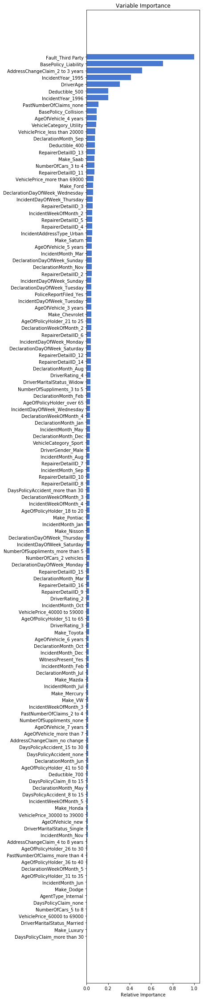

In [10]:
# increasing this lowers number of kept variables
keep_threshold = 0.05

## NOTE: This threshold of 0.05 only gives us 28 variables. I chose
# this to improve clustering models, which were getting too noisy 
# with too many variables. This slightly reduces performance of 
# supervised neural networks, which prefer more data. The 
# difference is slight however, and the clustering models seem 
# more useful so I decided to go with this threshold.

X = clean_df.drop('FraudFound', 1)
Y = clean_df.FraudFound

clf = GradientBoostingClassifier(n_estimators=5000, max_depth=2)
clf.fit(X, Y)
feature_importance = clf.feature_importances_

# Make importances relative to max importance.
feature_importance = (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0])

# gradient_importance is a new dataframe with only our most important
# variables. gradient_importance_weighted goes further and weights
# each variable by their feature importance which is determined by
# the gradient boosting classifier.

gradient_importance = pd.DataFrame()
gradient_importance_weighted = pd.DataFrame()

for column in range(len(X.columns)):
    if feature_importance[sorted_idx][column] > keep_threshold:
        gradient_importance[X.columns[sorted_idx][column]] = X[X.columns[sorted_idx][column]]
        gradient_importance_weighted[X.columns[sorted_idx][column]] = X[X.columns[sorted_idx][column]] * feature_importance[sorted_idx][column]

input_vars = len(gradient_importance.columns)
gradient_importance['FraudFound'] = clean_df.FraudFound
gradient_importance_weighted['FraudFound'] = clean_df.FraudFound

plt.figure(figsize=(10,40))
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

In [11]:
# --- Initial modeling, using random forest ---
# Pretty good, right?

X = gradient_importance.drop('FraudFound', 1)
Y = gradient_importance.FraudFound

rfc = RandomForestClassifier()
results = cross_val_score(rfc, X, Y, cv=6)
print(results)
print('Average Accuracy:', results.sum()/6)

[0.92483152 0.93360996 0.93253762 0.93201868 0.93565127 0.9309808 ]
Average Accuracy: 0.9316049755235816


In [12]:
# Homemade model:
predictions = []
for row in range(len(gradient_importance)):
    predictions.append(0)

# Validation:
correct = 0
for prediction in range(len(predictions)):
    if predictions[prediction] == gradient_importance.FraudFound[prediction]:
        correct += 1
print('Accuracy of Homemade Naive Model:', correct/len(gradient_importance))

# Beats random forest! 
# Maybe the random forest model isn't good after all...

Accuracy of Homemade Naive Model: 0.9423259835711197


In [13]:
# Confusion matrix reveals that the model is basically just 
# predicting all 'not fraud'

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)

rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

y_test, confusion = list(y_test), [[0,0], [0,0]]
for i in range(len(X_test)):
    x = 0 if y_test[i] == 1 else 1
    y = 0 if y_pred[i] == 1 else 1
    confusion[x][y] += 1

print('\t\t   Prediction')
print('\t\t Fraud', ' Not Fraud')
print('Actual Fraud\t', confusion[0][0], '    ', confusion[0][1])
print('Actual Not Fraud', confusion[1][0], '    ', confusion[1][1])

		   Prediction
		 Fraud  Not Fraud
Actual Fraud	 5      127
Actual Not Fraud 23      2158


We want a model that finds fraud, but we are limited because we do not want to investigate every claim because investigating **costs money**.

Accuracy is not a good metric of success for this kind of problem since our data is imbalanced. Instead, we will use *precision* and *recall*.

We want a model with the greatest percent of correctly predicted fraud (precision) while maximizing the percent of fraud that was found by the model (recall.) We 'average' these two into an F1 score. This will be our evaluation metric.

I chose to use neural networks to model this problem despite it being overkill for basic tabular data because it is highly customizable and I wanted to learn how to use Keras and Tensorflow.

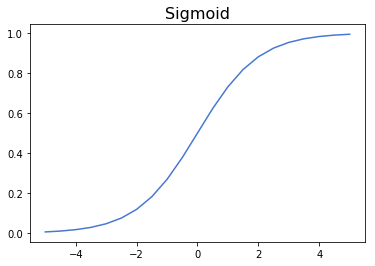

In [14]:
# I used a sigmoid activation function in the output layer of my 
# neural network models because I wanted a continuous output as 
# opposed to a binary 'fraud' or 'not fraud.' The reason for this 
# is that I can manually set different thresholds to get an ideal 
# precision and recall, or F1 score.
x, y = [], []
for i in range(21):
    x.append(-5 + .5*i)
    y.append(1/(1 + math.exp(-x[-1])))
plt.plot(x, y)
plt.title('Sigmoid', fontsize=16)
plt.show()

W1025 14:07:05.175453 140735549801344 deprecation.py:323] From /anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


   ---   
 Threshold: 0.0001 
 [120, 0] 
 [2193, 0]
Accuracy: 0.05188067444876784
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.05188067422446747
F1: 0.09864271122936087
   ---   
 Threshold: 0.001 
 [120, 0] 
 [2193, 0]
Accuracy: 0.05188067444876784
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.05188067422446747
F1: 0.09864271122936087
   ---   
 Threshold: 0.01 
 [120, 0] 
 [2071, 122]
Accuracy: 0.10462602680501513
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.05476951138854627
F1: 0.10385016121409112
   ---   
 Threshold: 0.05 
 [105, 15] 
 [972, 1221]
Accuracy: 0.5732814526588845
Sensitivity / Recall: 0.8749999270833394 
Precision: 0.09749303530647135
F1: 0.17543678956959782
   ---   
 Threshold: 0.075 
 [84, 36] 
 [679, 1514]
Accuracy: 0.6908776480760916
Sensitivity / Recall: 0.6999999416666715 
Precision: 0.11009174167638609
F1: 0.19025812274190224
   ---   
 Threshold: 0.1 
 [56, 64] 
 [389, 1804]
Accuracy: 0.8041504539559015
Sensitivity / Recall: 0.46

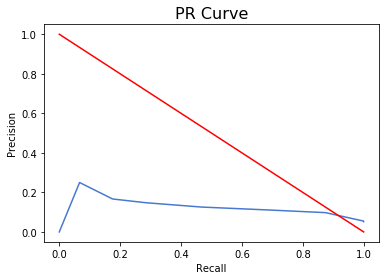

Best F1 Score: 0.198 at threshold 0.1


In [15]:
# Base, using standardized data

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)
pr_data = [[], []]
# Scoring the model at different thresholds to find the best F1
thresholds = [.0001 ,.001, .01, .05, .075, .1, .125, .15, .2, .3, .5, .99, 1]
best_f1, best_threshold = 0, 0

# Model architecture using Keras
model = tfk.models.Sequential()
model.add(tfk.layers.Dense(20, input_shape=(input_vars,), activation='relu'))
model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
model.compile(optimizer='adam',
             loss='binary_crossentropy',
             metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, verbose=0, batch_size=200)
y_pred = model.predict(X_test, verbose=0)

for threshold in thresholds:
    y_predict = []
    for i in range(len(y_pred)):
        y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

    confusion = [[0,0],[0,0]]

    for i in range(len(y_test)):                
        x = 0 if list(y_test)[i] == 1 else 1
        y = 0 if y_predict[i] == 1 else 1
        confusion[x][y] += 1
            
    print('   ---   \n', 'Threshold:', threshold, '\n', confusion[0], '\n', confusion[1])
    # To prevent division by 0 I add an insignificant constant to the denominator.
    sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001)
    precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)
    pr_data[0].append(sensitivity)
    pr_data[1].append(precision)
    print('Accuracy:', (confusion[0][0] + confusion[1][1])/(sum(confusion[0]) + sum(confusion[1])))
    print('Sensitivity / Recall:', sensitivity, '\nPrecision:', precision)
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
    print('F1:', f1)
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = threshold

plt.plot(pr_data[0], pr_data[1])
plt.plot([0,1],[1,0], color='red')
plt.title('PR Curve', fontsize=16)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

print('Best F1 Score:', round(best_f1,3), 'at threshold', best_threshold)

In [16]:
# Comparing resampling techniques to our F1 score baseline from the
# previous cell. SMOTE: Synthetic minority oversampling technique
# SMOTEENNN: SMOTE + ENN, Edited nearest neighbors.

smote = SMOTE()
X_sm, y_sm = smote.fit_sample(X_train, y_train)

smoteenn = SMOTEENN()
X_smenn, y_smenn = smoteenn.fit_sample(X_train, y_train)

   ---   
 Threshold: 0.0001 
 [120, 0] 
 [2193, 0]
Accuracy: 0.05188067444876784
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.05188067422446747
F1: 0.09864271122936087
   ---   
 Threshold: 0.001 
 [120, 0] 
 [2138, 55]
Accuracy: 0.07565931690445309
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.053144375318226855
F1: 0.10092418802066894
   ---   
 Threshold: 0.01 
 [120, 0] 
 [2007, 186]
Accuracy: 0.13229571984435798
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.056417489156476305
F1: 0.10680806678062225
   ---   
 Threshold: 0.05 
 [119, 1] 
 [1597, 596]
Accuracy: 0.30912235192390836
Sensitivity / Recall: 0.9916665840277846 
Precision: 0.06934731894319744
F1: 0.12962840647665722
   ---   
 Threshold: 0.075 
 [118, 2] 
 [1390, 803]
Accuracy: 0.3981841763942931
Sensitivity / Recall: 0.9833332513888957 
Precision: 0.07824933635113172
F1: 0.1449617776570699
   ---   
 Threshold: 0.1 
 [117, 3] 
 [1235, 958]
Accuracy: 0.46476437527021186
Sensitivity / Recall: 0

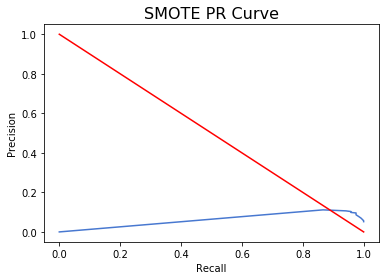

Best F1 Score: 0.198 at threshold 0.5


In [17]:
# Trying the same exact model but with resampled input data using
# SMOTE

pr_data = [[], []]
thresholds = [.0001 ,.001, .01, .05, .075, .1, .125, .15, .2, .3, .5, .99, 1]
best_f1, best_threshold = 0, 0

model = tfk.models.Sequential()
model.add(tfk.layers.Dense(10, input_shape=(input_vars,), activation='relu'))
model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
model.compile(optimizer='adam',
             loss='binary_crossentropy',
             metrics=['accuracy'])
model.fit(X_sm, y_sm, epochs=10, verbose=0, batch_size=200)
y_pred = model.predict(X_test, verbose=0)

for threshold in thresholds:
    y_predict = []
    for i in range(len(y_pred)):
        y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

    confusion = [[0,0],[0,0]]

    for i in range(len(y_test)):                
        x = 0 if list(y_test)[i] == 1 else 1
        y = 0 if y_predict[i] == 1 else 1
        confusion[x][y] += 1
            
    print('   ---   \n', 'Threshold:', threshold, '\n', confusion[0], '\n', confusion[1])
    sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001) # prevent division by 0
    precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)
    pr_data[0].append(sensitivity)
    pr_data[1].append(precision)
    print('Accuracy:', (confusion[0][0] + confusion[1][1])/(sum(confusion[0]) + sum(confusion[1])))
    print('Sensitivity / Recall:', sensitivity, '\nPrecision:', precision)
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
    print('F1:', f1)
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = threshold

plt.plot(pr_data[0], pr_data[1])
plt.plot([0,1],[1,0], color='red')
plt.title('SMOTE PR Curve', fontsize=16)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

print('Best F1 Score:', round(best_f1,3), 'at threshold', best_threshold)

   ---   
 Threshold: 0.0001 
 [120, 0] 
 [2101, 92]
Accuracy: 0.09165585819282317
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.05402971610072167
F1: 0.10251931695659293
   ---   
 Threshold: 0.001 
 [120, 0] 
 [1847, 346]
Accuracy: 0.2014699524427151
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.06100660873916315
F1: 0.1149965192708843
   ---   
 Threshold: 0.01 
 [120, 0] 
 [1526, 667]
Accuracy: 0.34025075659316906
Sensitivity / Recall: 0.9999999166666735 
Precision: 0.07290400927761842
F1: 0.13589907156460962
   ---   
 Threshold: 0.05 
 [116, 4] 
 [1111, 1082]
Accuracy: 0.5179420665801989
Sensitivity / Recall: 0.9666665861111178 
Precision: 0.0945395265318702
F1: 0.1722329698472436
   ---   
 Threshold: 0.075 
 [116, 4] 
 [1056, 1137]
Accuracy: 0.5417207090358841
Sensitivity / Recall: 0.9666665861111178 
Precision: 0.09897610837051102
F1: 0.17956487564952206
   ---   
 Threshold: 0.1 
 [115, 5] 
 [1019, 1174]
Accuracy: 0.5572849113705145
Sensitivity / Recall: 0.9

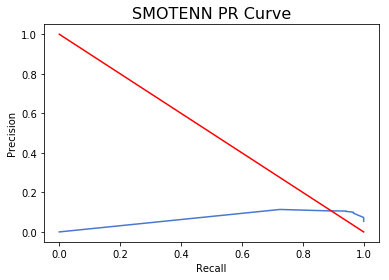

Best F1 Score: 0.196 at threshold 0.5


In [18]:
# SMOTEEN

pr_data = [[], []]
thresholds = [.0001 ,.001, .01, .05, .075, .1, .125, .15, .2, .3, .5, .99, 1]
best_f1, best_threshold = 0, 0

model = tfk.models.Sequential()
model.add(tfk.layers.Dense(20, input_shape=(input_vars,), activation='relu'))
model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
model.compile(optimizer='adam',
             loss='binary_crossentropy',
             metrics=['accuracy'])
model.fit(X_smenn, y_smenn, epochs=20, verbose=0, batch_size=200)
y_pred = model.predict(X_test, verbose=0)

for threshold in thresholds:
    y_predict = []
    for i in range(len(y_pred)):
        y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

    confusion = [[0,0],[0,0]]

    for i in range(len(y_test)):                
        x = 0 if list(y_test)[i] == 1 else 1
        y = 0 if y_predict[i] == 1 else 1
        confusion[x][y] += 1
            
    print('   ---   \n', 'Threshold:', threshold, '\n', confusion[0], '\n', confusion[1])
    sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001) # prevent division by 0
    precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)
    pr_data[0].append(sensitivity)
    pr_data[1].append(precision)
    print('Accuracy:', (confusion[0][0] + confusion[1][1])/(sum(confusion[0]) + sum(confusion[1])))
    print('Sensitivity / Recall:', sensitivity, '\nPrecision:', precision)
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
    print('F1:', f1)
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = threshold

plt.plot(pr_data[0], pr_data[1])
plt.plot([0,1],[1,0], color='red')
plt.title('SMOTENN PR Curve', fontsize=16)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

print('Best F1 Score:', round(best_f1,3), 'at threshold', best_threshold)

In [19]:
# I will proceed with SMOTE, and want to use cross validation
# during my model tweaking. This cell makes 6 splits and resamples
# the train data using SMOTE.

sm_1, sm_2, sm_3, sm_4, sm_5, sm_6, = SMOTE(), SMOTE(), SMOTE(), SMOTE(), SMOTE(), SMOTE()
splits = [sm_1, sm_2, sm_3, sm_4, sm_5, sm_6]

Xs, Ys = [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]
X_tests, y_tests = [], []

for split in range(len(splits)):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)
    X_train, X_test, y_train, y_test = X_train.values, X_test.values, y_train.values, y_test.values
    X_tests.append(X_test.copy())
    y_tests.append(y_test.copy())
    
    Xs[split], Ys[split] = splits[split].fit_sample(X_train, y_train)

In [20]:
# Comparing ReLU and sigmoid activation on the hidden layers
# ReLU wins!

start = time.time()

thresholds =[.1, .3, .5, .7, .9]
f1s = []

for split in range(6):
    model = tfk.models.Sequential()
    model.add(tfk.layers.Dense(20, input_shape=(input_vars,), activation='relu'))
    model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
    model.compile(optimizer='adam',
                 loss='binary_crossentropy',
                 metrics=['accuracy'])
    
    best_f1, best_threshold = 0, 0
    
    model.fit(Xs[split], Ys[split], epochs=10, verbose=0, batch_size=200)
    y_pred = model.predict(X_tests[split], verbose=0)

    for threshold in thresholds:

        y_predict = []
        for i in range(len(y_pred)):
            y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

        confusion = [[0,0],[0,0]]
        for i in range(len(y_tests[split])):                
            x = 0 if list(y_tests[split])[i] == 1 else 1
            y = 0 if y_predict[i] == 1 else 1
            confusion[x][y] += 1

        sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001)
        precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)
        f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold

    f1s.append(best_f1)
print('--- ReLU ---')
print('Average F1:', sum(f1s)/6)

f1s = []

for split in range(6):
    model = tfk.models.Sequential()
    model.add(tfk.layers.Dense(20, input_shape=(input_vars,), activation='sigmoid'))
    model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
    model.compile(optimizer='adam',
                 loss='binary_crossentropy',
                 metrics=['accuracy'])
    
    best_f1, best_threshold = 0, 0
    
    model.fit(Xs[split], Ys[split], epochs=10, verbose=0, batch_size=200)
    y_pred = model.predict(X_tests[split], verbose=0)

    for threshold in thresholds:

        y_predict = []
        for i in range(len(y_pred)):
            y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

        confusion = [[0,0],[0,0]]
        for i in range(len(y_tests[0])):                
            x = 0 if list(y_tests[split])[i] == 1 else 1
            y = 0 if y_predict[i] == 1 else 1
            confusion[x][y] += 1

        sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001)
        precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)
        f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold

    f1s.append(best_f1)
print('--- SIGMOID --- ')
print('Average F1:', sum(f1s)/6)

--- ReLU ---
Average F1: 0.2256038837105305
--- SIGMOID --- 
Average F1: 0.21246153647234448


Dropout: 0.0
Neurons: 20
Epochs: 10
Average F1: 0.19705361729699158
   ---   
Dropout: 0.05
Neurons: 24
Epochs: 15
Average F1: 0.20007206707643596
   ---   
Dropout: 0.1
Neurons: 28
Epochs: 20
Average F1: 0.20359201677310476
   ---   
Dropout: 0.15000000000000002
Neurons: 32
Epochs: 25
Average F1: 0.20419959868896523
   ---   
Dropout: 0.2
Neurons: 36
Epochs: 30
Average F1: 0.20756900170169632
   ---   
Dropout: 0.25
Neurons: 40
Epochs: 35
Average F1: 0.20715026153628746
   ---   
Dropout: 0.30000000000000004
Neurons: 44
Epochs: 40
Average F1: 0.2057803907065123
   ---   
Dropout: 0.35000000000000003
Neurons: 48
Epochs: 45
Average F1: 0.20620362646858245
   ---   


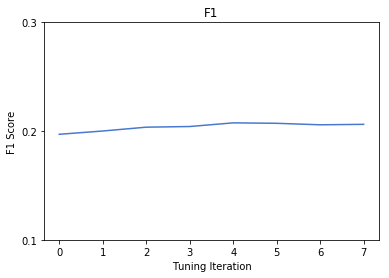

In [21]:
# Parameter Search
# Tuning 3 parameters at once: Number of neurons in both hidden 
# layers, percent dropout before each hidden layer, number of 
# epochs. Dropout reduces overfitting but requires more epochs and 
# neurons, so I increase them all together.

# Unfortunately, increasing the size of the neural net architecture
# does not improve performance significantly for this problem. Our
# data is a little too simple.

threshold = 0.5
parameter_f1s = []
for tuning in range(8):
    f1s = []
    print('Dropout:', tuning * 0.05)
    print('Neurons:', 20 + tuning * 4)
    print('Epochs:', 10 + tuning * 5)
    for split in range(6):
        model = tfk.models.Sequential()
        model.add(tfk.layers.Dropout(tuning * 0.05))
        model.add(tfk.layers.Dense(20 + tuning * 4, input_shape=(input_vars,), activation='relu'))
        model.add(tfk.layers.Dropout(tuning * 0.05))
        model.add(tfk.layers.Dense(20 + tuning * 4, activation='relu'))
        model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
        model.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

        model.fit(Xs[split], Ys[split], epochs=10 + tuning * 5, verbose=0, batch_size=200)
        y_pred = model.predict(X_tests[split], verbose=0)

        y_predict = []
        for i in range(len(y_pred)):
            y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

        confusion = [[0,0],[0,0]]
        for i in range(len(y_tests[split])):                
            x = 0 if list(y_tests[split])[i] == 1 else 1
            y = 0 if y_predict[i] == 1 else 1
            confusion[x][y] += 1

        sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001)
        precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)
        f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
        f1s.append(f1)
    
    parameter_f1s.append(sum(f1s)/6)
    print('Average F1:', sum(f1s)/6)
    print('   ---   ')

plt.title('F1')
plt.ylabel('F1 Score')
plt.xlabel('Tuning Iteration')
plt.plot(range(8), parameter_f1s)
plt.yticks([.1,.2,.3])
plt.show()

In [22]:
# Final model
# 2 dropout layers of 0.1, 2 hidden layer with 28 neurons and 
# relu activation, 20 epochs.

start = time.time()
thresholds = [.35, .4, .45, .5, .55, .6, .65]
f1s = []

for split in range(6):
    
    best_f1, best_threshold = 0, 0
    
    model = tfk.models.Sequential()
    model.add(tfk.layers.Dropout(0.1))
    model.add(tfk.layers.Dense(28, input_shape=(input_vars,), activation='relu'))
    model.add(tfk.layers.Dropout(0.1))
    model.add(tfk.layers.Dense(28, activation='relu'))
    model.add(tfk.layers.Dense(1, activation='sigmoid', kernel_initializer='uniform'))
    model.compile(optimizer='adam',
                 loss='binary_crossentropy',
                 metrics=['accuracy'])
    
    model.fit(Xs[split], Ys[split], epochs=20, verbose=0)
    y_pred = model.predict(X_tests[split], verbose=0)
    for threshold in thresholds:

        y_predict = []
        for i in range(len(y_pred)):
            y_predict.append(1) if y_pred[i] >= threshold else y_predict.append(0)

        confusion = [[0,0],[0,0]]

        for i in range(len(y_tests[split])):                
            x = 0 if list(y_tests[split])[i] == 1 else 1
            y = 0 if y_predict[i] == 1 else 1
            confusion[x][y] += 1

        sensitivity = confusion[0][0]/(confusion[0][0] + confusion[0][1] + 0.00001)
        specificity = confusion[1][1]/(confusion[1][1] + confusion[1][0] + 0.00001)
        precision = confusion[0][0]/(confusion[0][0] + confusion[1][0] + 0.00001)

        f1 = 2 * (precision * sensitivity) / (precision + sensitivity + 0.00001)
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold
    print('Best Threshold:', best_threshold)
    print('Best F1:', best_f1)
    f1s.append(best_f1)
    

print('F1s:', f1s)
print('Average F1:', sum(f1s)/6)
end = time.time()
print('Runtime:', end-start)


Best Threshold: 0.65
Best F1: 0.2164749221835852
Best Threshold: 0.35
Best F1: 0.1867903545623636
Best Threshold: 0.6
Best F1: 0.21351068221404612
Best Threshold: 0.35
Best F1: 0.20284142302808936
Best Threshold: 0.6
Best F1: 0.2081190162775069
Best Threshold: 0.6
Best F1: 0.21803208291528028
F1s: [0.2164749221835852, 0.1867903545623636, 0.21351068221404612, 0.20284142302808936, 0.2081190162775069, 0.21803208291528028]
Average F1: 0.2076280801968119
Runtime: 145.5744321346283


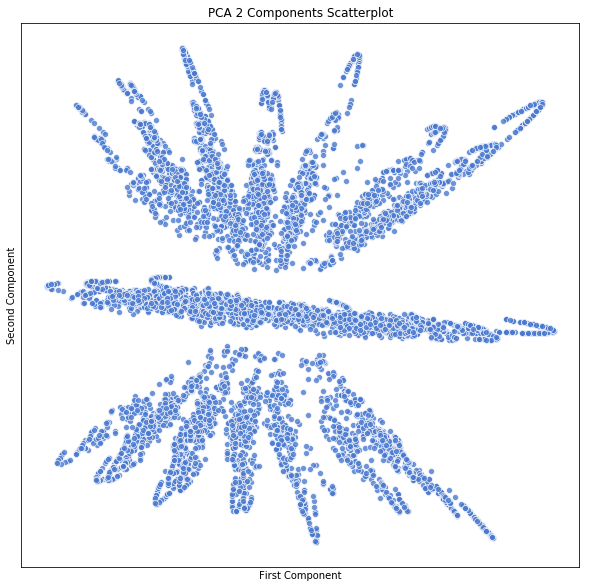

In [23]:
# Clustering

# I now explore using unsupervised learning techniques to help
# find insurance fraud. Below is a 2 dimensional representation of
# our data using priciple component analysis.

# *NOTE* This representation is very limited since we have 28
# variables, so don't be surprised when clustering does not make
# sense visually for how to split this image.

norm_df = normalize(gradient_importance.drop('FraudFound', 1))

pca = PCA(n_components=2)
X_pca = pca.fit_transform(norm_df)

draw = pd.DataFrame()
draw['PCA 1'] = X_pca.T[0]
draw['PCA 2'] = X_pca.T[1]
plt.figure(figsize=(10, 10))
sns.scatterplot('PCA 1', 'PCA 2', data=draw, alpha=0.8)
plt.title('PCA 2 Components Scatterplot')
plt.xlabel('First Component')
plt.ylabel('Second Component')
plt.xticks([])
plt.yticks([])
plt.show()

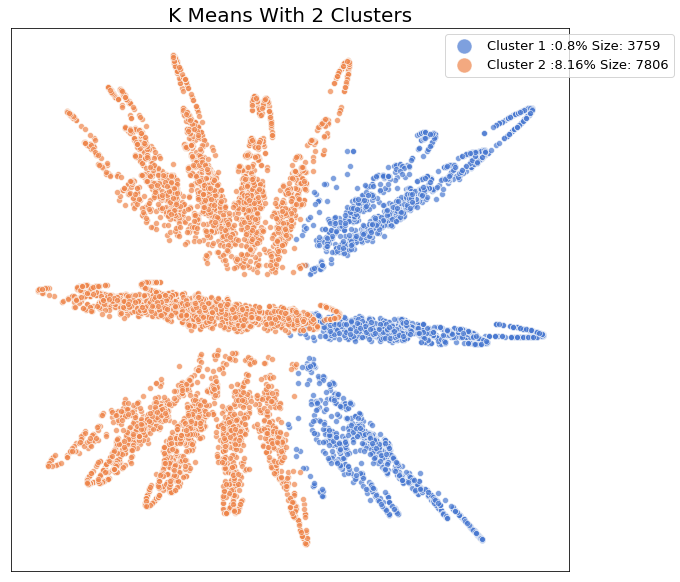

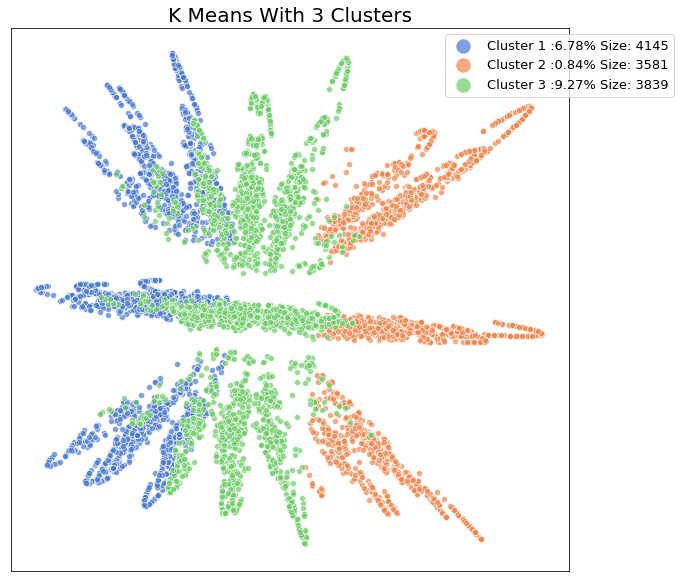

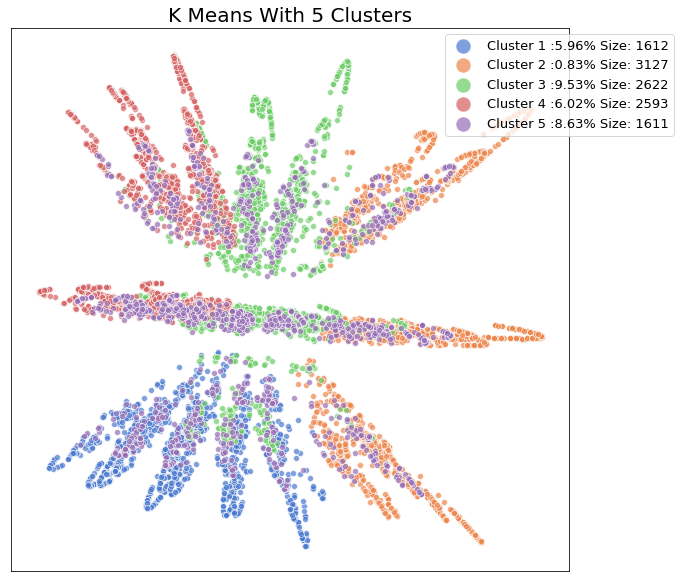

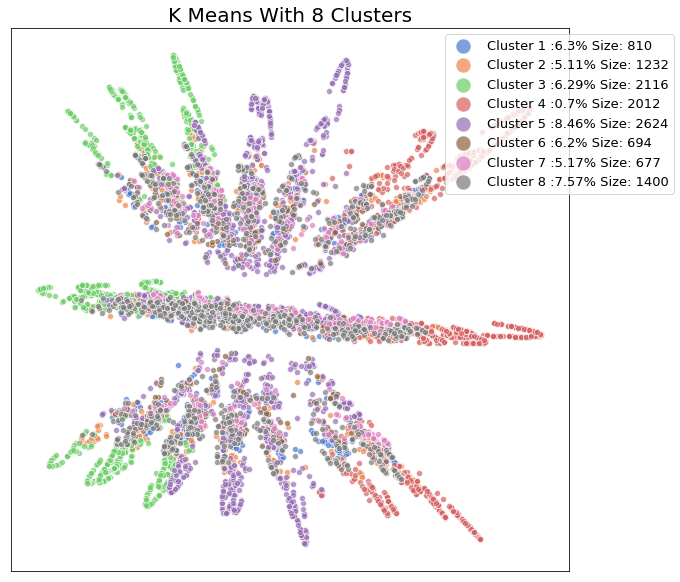

In [48]:
# KMEANS

# The legend for each graph shows the percent fraud in each
# cluster. Hopefully, our clustering algorithms will find clusters
# that have a high percent chance of fraud.

score_df = pd.DataFrame()
score_df['FraudFound'] = raw_data.FraudFound
active = norm_df

for cluster in [2, 3, 5, 8]:
    num_clusters = cluster
    cluster_percents = []

    score_df['Cluster'] = KMeans(n_clusters=num_clusters).fit_predict(active)
    for cluster in range(len(score_df.Cluster.unique())):
        clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
        clus_len = len(score_df[score_df.Cluster == cluster])
        cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))

    clusters = []
    for i in range(num_clusters):
        clusters.append([]) 
    for index in range(len(score_df)):
        for cluster in range(num_clusters):
            if score_df.Cluster[index] == cluster:
                clusters[cluster].append(index)

    plt.figure(figsize=(10,10))
    draw['Cluster'] = score_df.Cluster.copy()
    for cluster in range(num_clusters):
        sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
    plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
    plt.title('K Means With ' + str(num_clusters) + ' Clusters', fontsize=20)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.show()

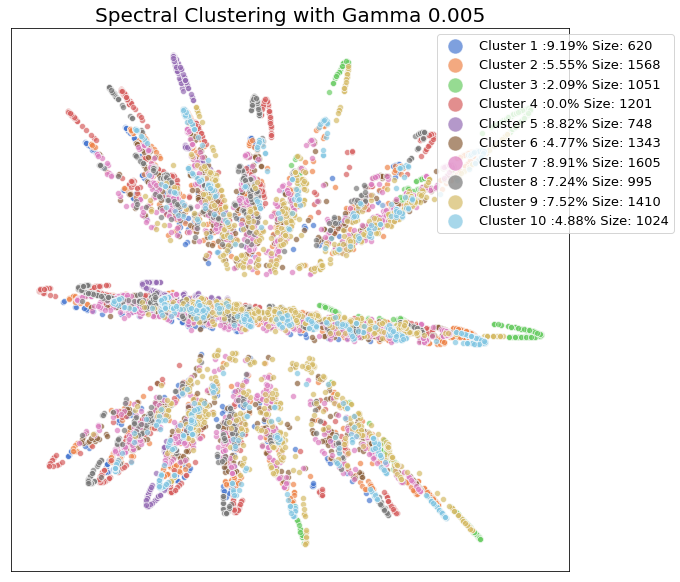

In [25]:
# Spectral Clustering
# Not really finding anything.

active = norm_df
gamma = 0.005
num_clusters = 10

cluster_percents = []
score_df['Cluster'] = SpectralClustering(gamma=.001, n_clusters=num_clusters).fit_predict(active)
for cluster in range(len(score_df.Cluster.unique())):
    clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
    clus_len = len(score_df[score_df.Cluster == cluster])
    cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))
    
clusters = []
for i in range(num_clusters):
    clusters.append([]) 
for index in range(len(score_df)):
    for cluster in range(num_clusters):
        if score_df.Cluster[index] == cluster:
            clusters[cluster].append(index)

plt.figure(figsize=(10,10))
draw['Cluster'] = score_df.Cluster.copy()
for cluster in range(num_clusters):
    sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.title('Spectral Clustering with Gamma ' + str(gamma), fontsize=20)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

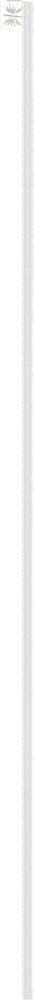

In [26]:
# MeanShift
active = norm_df
bandwidth = .5
# 1 -- 19

cluster_percents = []
score_df['Cluster'] = MeanShift(bandwidth=bandwidth).fit_predict(active)
num_clusters = len(score_df.Cluster.unique())
for cluster in range(len(score_df.Cluster.unique())):
    clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
    clus_len = len(score_df[score_df.Cluster == cluster])
    cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))
    
clusters = []
for i in range(num_clusters):
    clusters.append([]) 
for index in range(len(score_df)):
    for cluster in range(num_clusters):
        if score_df.Cluster[index] == cluster:
            clusters[cluster].append(index)

plt.figure(figsize=(10,10))
draw['Cluster'] = score_df.Cluster.copy()
for cluster in range(num_clusters):
    sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.title('MeanShift with Bandwidth ' + str(bandwidth), fontsize=20)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

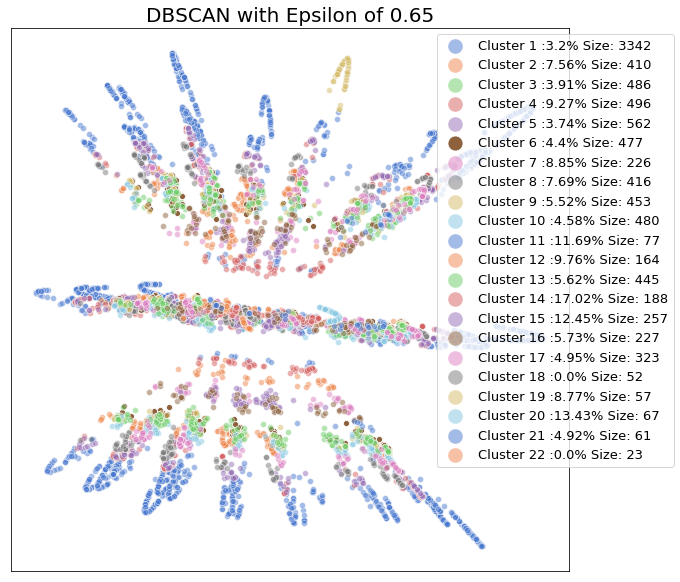

In [27]:
# DBSCAN

active = norm_df
epsilon = .65
cluster_percents = []
score_df['Cluster'] = DBSCAN(eps=epsilon, min_samples = 50).fit_predict(active)
num_clusters = len(score_df.Cluster.unique())
for cluster in range(len(score_df.Cluster.unique())):
    clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
    clus_len = len(score_df[score_df.Cluster == cluster])
    try:
        cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))
    except:
        None
clusters = []
for i in range(num_clusters):
    clusters.append([]) 
for index in range(len(score_df)):
    for cluster in range(num_clusters):
        if score_df.Cluster[index] == cluster:
            clusters[cluster].append(index)

plt.figure(figsize=(10,10))
draw['Cluster'] = score_df.Cluster.copy()
for cluster in range(num_clusters):
    alp = 1 if cluster in [5] else 0.5
    sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=alp)
    
plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.title('DBSCAN with Epsilon of ' + str(epsilon), fontsize=20)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

From here, I will use a weighted model, which was generated earlier from a gradient tree boosting model. Since there are a lot of dimensions, the unweighted model is generating too much noise and not finding patterns that are related to fraud. The following models are 'semi-supervised' and provide much more value.

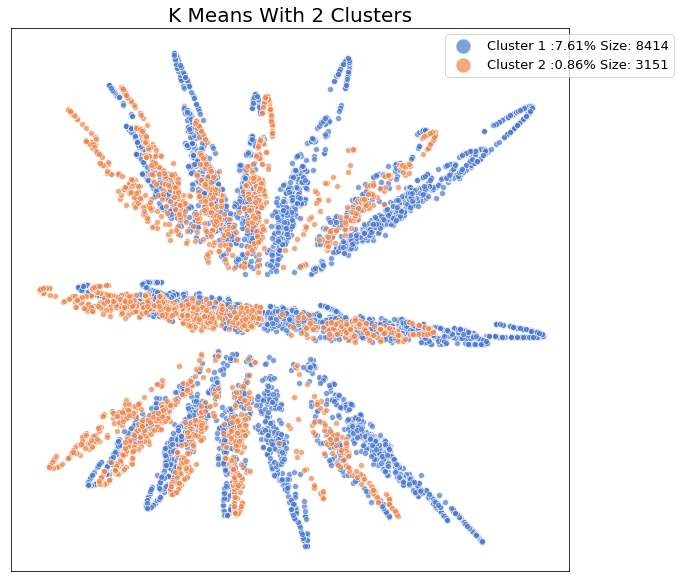

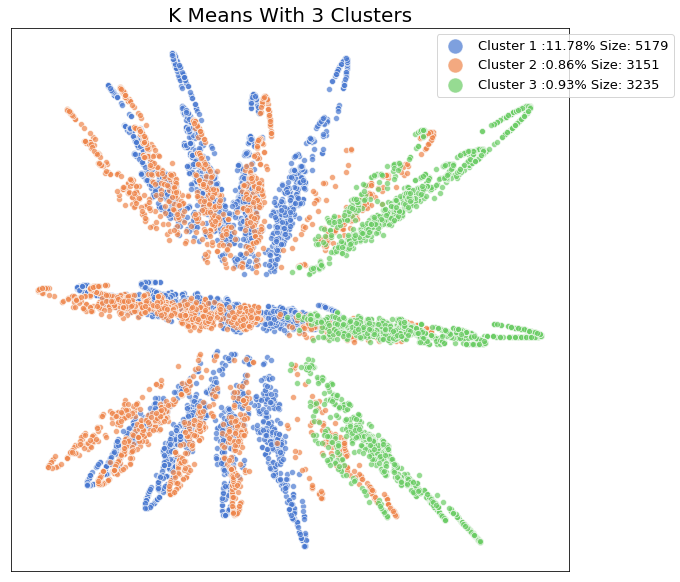

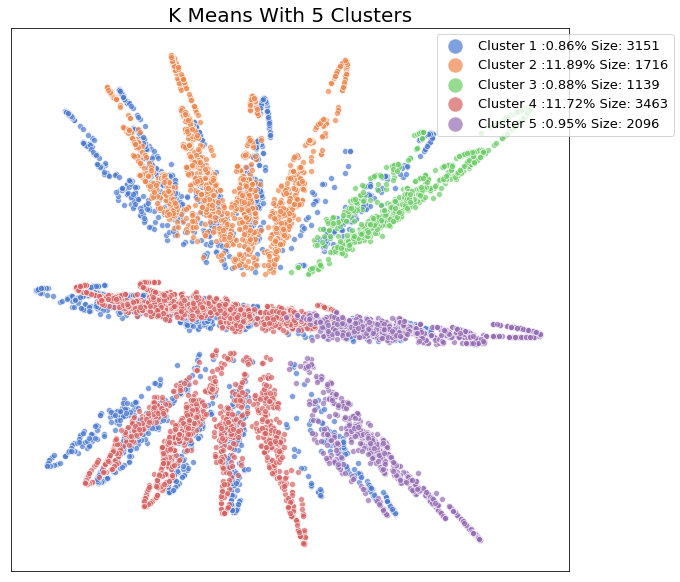

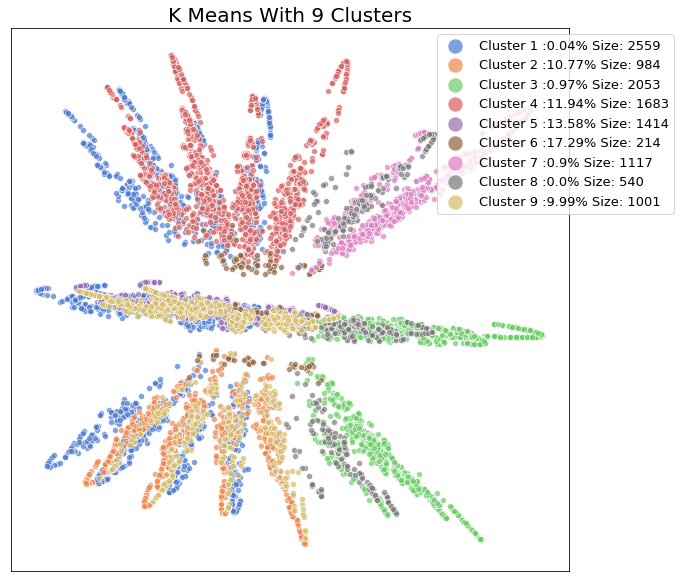

In [50]:
# KMEANS

# With k=3 we already find a cluster of about half the data that has
# an 11% chance of fraud. With k=9 there is a cluster of 214 with
# over 17% chance of fraud.
score_df = pd.DataFrame()
score_df['FraudFound'] = raw_data.FraudFound
active = normalize(gradient_importance_weighted.drop('FraudFound', 1))

for cluster in [2, 3, 5, 9]:
    num_clusters = cluster
    cluster_percents = []

    score_df['Cluster'] = KMeans(n_clusters=num_clusters).fit_predict(active)
    for cluster in range(len(score_df.Cluster.unique())):
        clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
        clus_len = len(score_df[score_df.Cluster == cluster])
        cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))

    clusters = []
    for i in range(num_clusters):
        clusters.append([]) 
    for index in range(len(score_df)):
        for cluster in range(num_clusters):
            if score_df.Cluster[index] == cluster:
                clusters[cluster].append(index)

    plt.figure(figsize=(10,10))
    draw['Cluster'] = score_df.Cluster.copy()
    for cluster in range(num_clusters):
        sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
    plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
    plt.title('K Means With ' + str(num_clusters) + ' Clusters', fontsize=20)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.show()

In [29]:
# This function helps us compare a cluster with high percent chance
# of fraud with the overall population to help find differences.

def compare_distribution(cluster, feature):
    feature_corpus = raw_data[feature].unique()
    if len(feature_corpus) < 20:
        cluster_count, overall_count = [], []
        for feat in feature_corpus:
            cluster_count.append(len(cluster[cluster[feature] == feat]))
            overall_count.append(len(raw_data[raw_data[feature] == feat]))

        fig, axes = plt.subplots(1, 2, figsize=(10,5))
        sns.barplot(feature_corpus, cluster_count, ax=axes[0])
        sns.barplot(feature_corpus, overall_count, ax=axes[1])
        axes[0].set_title('Cluster ' + feature, fontsize=16)
        axes[1].set_title('Overall ' + feature, fontsize=16)
        plt.show()
    else:
        fig, axes = plt.subplots(1, 2, figsize=(10,5))
        sns.distplot(cluster[feature], ax=axes[0])
        sns.distplot(raw_data[feature], ax=axes[1])
        axes[0].set_title('Cluster ' + feature, fontsize=16)
        axes[1].set_title('Overall ' + feature, fontsize=16)
        plt.show()

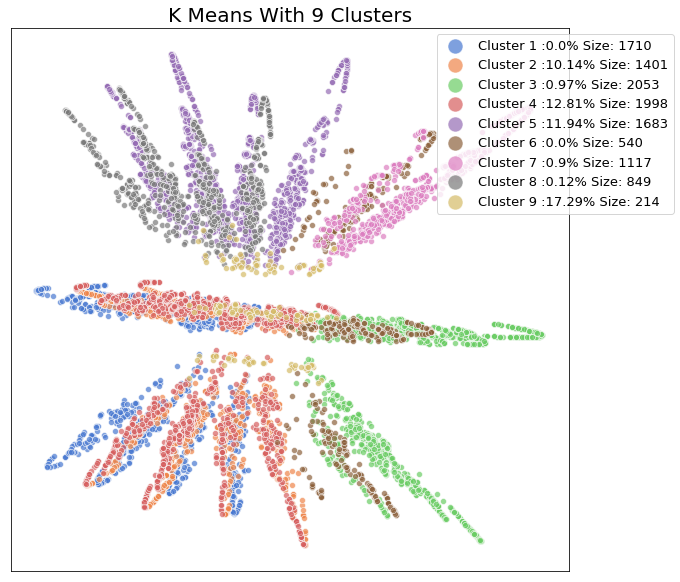

In [30]:
active = normalize(gradient_importance_weighted.drop('FraudFound', 1))

for cluster in [9]:
    num_clusters = cluster
    cluster_percents = []

    score_df['Cluster'] = KMeans(n_clusters=num_clusters).fit_predict(active)
    for cluster in range(len(score_df.Cluster.unique())):
        clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
        clus_len = len(score_df[score_df.Cluster == cluster])
        cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))

    clusters = []
    for i in range(num_clusters):
        clusters.append([]) 
    for index in range(len(score_df)):
        for cluster in range(num_clusters):
            if score_df.Cluster[index] == cluster:
                clusters[cluster].append(index)

    plt.figure(figsize=(10,10))
    draw['Cluster'] = score_df.Cluster.copy()
    for cluster in range(num_clusters):
        sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
    plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
    plt.title('K Means With ' + str(num_clusters) + ' Clusters', fontsize=20)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.show()

In [31]:
# Our high percent cluster of 214.

kmeans_fraud_cluster = raw_data[score_df.Cluster == 8]
kmeans_fraud_cluster

,IncidentMonth,IncidentWeekOfMonth,IncidentDayOfWeek,Make,IncidentAddressType,DeclarationDayOfWeek,DeclarationMonth,DeclarationWeekOfMonth,DriverGender,DriverMaritalStatus,DriverAge,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound,PolicyNumber,RepairerDetailID,Deductible,DriverRating,DaysPolicyAccident,DaysPolicyClaim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChangeClaim,NumberOfCars,IncidentYear,BasePolicy
108,Apr,3,Friday,Mazda,Rural,Monday,Apr,3,Male,Married,39,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,7243,9,500,4,more than 30,more than 30,1,7 years,36 to 40,No,No,External,more than 5,2 to 3 years,1 vehicle,1995,Collision
141,Mar,1,Tuesday,Pontiac,Urban,Tuesday,Mar,1,Female,Single,39,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,13057,10,500,2,more than 30,more than 30,none,7 years,36 to 40,No,No,External,more than 5,2 to 3 years,1 vehicle,1996,Collision
188,Apr,5,Sunday,Pontiac,Urban,Tuesday,May,1,Male,Married,76,Third Party,Sedan - Collision,Sedan,20000 to 29000,0,3061,6,500,3,more than 30,more than 30,none,more than 7,over 65,No,No,External,none,2 to 3 years,1 vehicle,1994,Collision
252,Nov,1,Friday,Honda,Urban,Thursday,Nov,3,Male,Married,51,Policy Holder,Sedan - All Perils,Sedan,30000 to 39000,0,1378,16,500,3,more than 30,more than 30,none,more than 7,41 to 50,No,No,External,none,2 to 3 years,1 vehicle,1994,All Perils
255,Nov,2,Tuesday,Chevrolet,Urban,Wednesday,Nov,2,Male,Married,50,Policy Holder,Sedan - All Perils,Sedan,30000 to 39000,0,10813,1,500,3,more than 30,more than 30,1,more than 7,41 to 50,No,No,External,3 to 5,2 to 3 years,1 vehicle,1995,All Perils
290,Mar,5,Tuesday,Mazda,Urban,Friday,Apr,1,Male,Married,47,Policy Holder,Sedan - Liability,Sport,20000 to 29000,0,9538,12,500,2,more than 30,more than 30,more than 4,more than 7,41 to 50,No,No,External,none,2 to 3 years,1 vehicle,1995,Liability
309,Dec,1,Monday,Pontiac,Urban,Friday,Dec,2,Female,Single,27,Third Party,Sedan - Liability,Sport,30000 to 39000,0,6121,10,500,1,more than 30,more than 30,more than 4,7 years,31 to 35,No,No,External,more than 5,2 to 3 years,1 vehicle,1994,Liability
321,Aug,2,Monday,Toyota,Urban,Wednesday,Aug,2,Male,Single,22,Third Party,Sedan - Liability,Sport,20000 to 29000,0,9436,5,300,3,more than 30,more than 30,more than 4,5 years,26 to 30,No,No,External,none,2 to 3 years,1 vehicle,1995,Liability
555,Feb,4,Wednesday,Pontiac,Urban,Monday,Feb,5,Female,Single,48,Policy Holder,Sedan - Liability,Sport,20000 to 29000,0,12292,15,500,4,more than 30,more than 30,2 to 4,7 years,41 to 50,No,No,External,none,2 to 3 years,1 vehicle,1996,Liability
562,Apr,2,Tuesday,Ford,Urban,Tuesday,Apr,3,Male,Married,44,Policy Holder,Sedan - All Perils,Sedan,20000 to 29000,1,2806,15,500,1,more than 30,more than 30,none,7 years,36 to 40,No,No,External,more than 5,2 to 3 years,1 vehicle,1994,All Perils


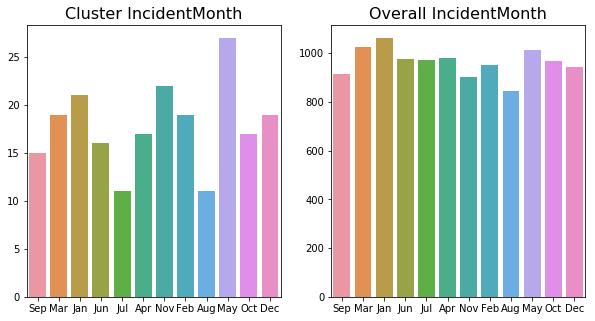

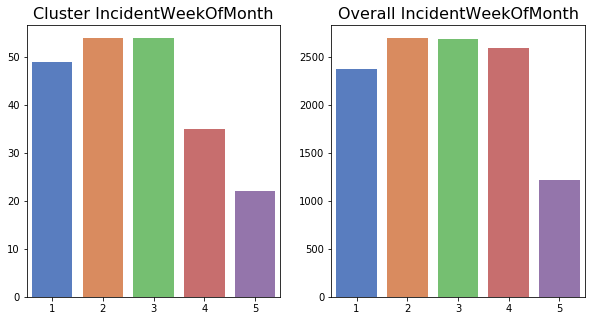

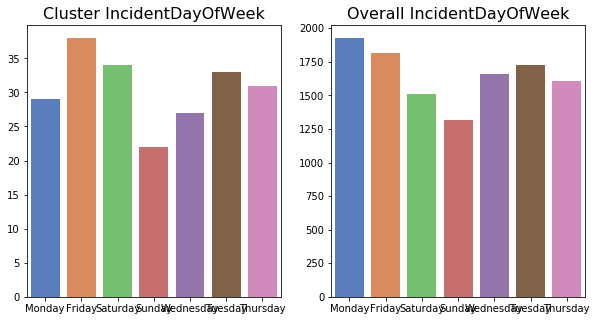

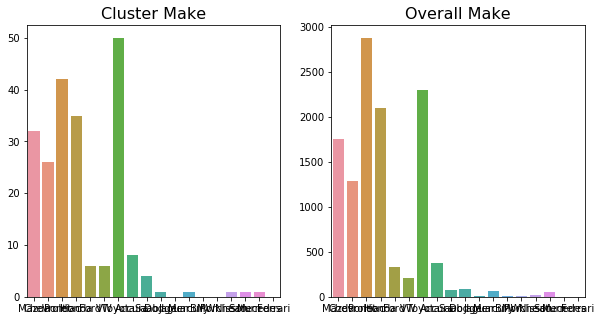

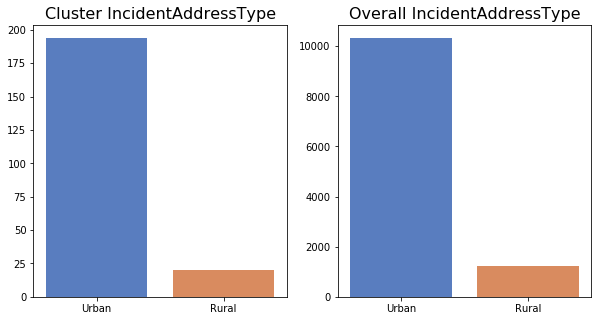

...

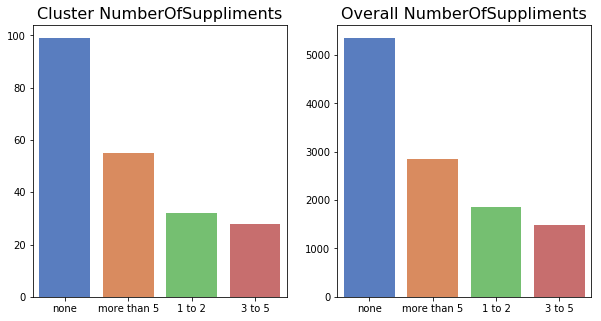

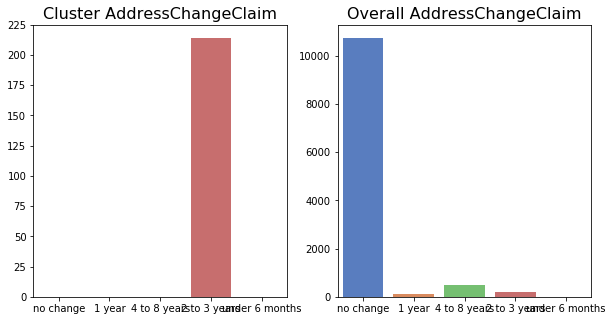

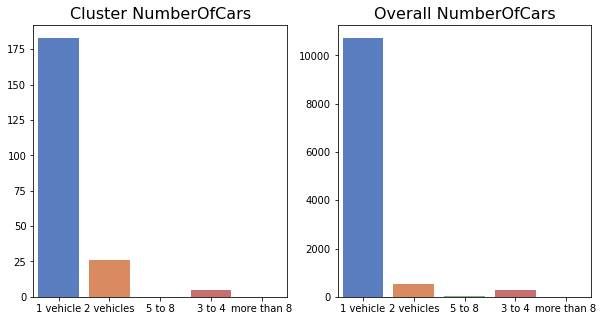

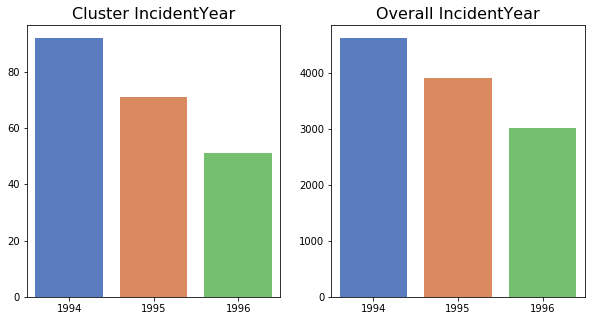

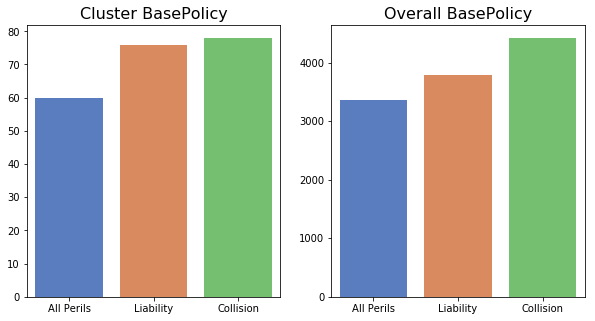

In [32]:
# This shows every feature. Check out deductible and address change.

for column in raw_data.columns:
    compare_distribution(kmeans_fraud_cluster, column)

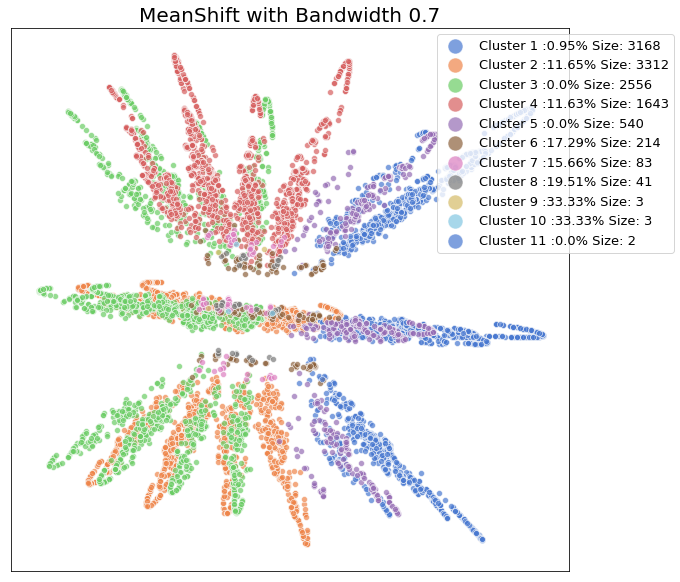

In [33]:
# MeanShift
active = normalize(gradient_importance_weighted.drop('FraudFound', 1))
bandwidth = .7
# 1 -- 19

cluster_percents = []
score_df['Cluster'] = MeanShift(bandwidth=bandwidth).fit_predict(active)
num_clusters = len(score_df.Cluster.unique())
for cluster in range(len(score_df.Cluster.unique())):
    clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
    clus_len = len(score_df[score_df.Cluster == cluster])
    cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))
    
clusters = []
for i in range(num_clusters):
    clusters.append([]) 
for index in range(len(score_df)):
    for cluster in range(num_clusters):
        if score_df.Cluster[index] == cluster:
            clusters[cluster].append(index)

plt.figure(figsize=(10,10))
draw['Cluster'] = score_df.Cluster.copy()
for cluster in range(num_clusters):
    sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.title('MeanShift with Bandwidth ' + str(bandwidth), fontsize=20)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

In [34]:
meanshift_fraud_cluster = raw_data[score_df.Cluster == 3]
meanshift_fraud_cluster

,IncidentMonth,IncidentWeekOfMonth,IncidentDayOfWeek,Make,IncidentAddressType,DeclarationDayOfWeek,DeclarationMonth,DeclarationWeekOfMonth,DriverGender,DriverMaritalStatus,DriverAge,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound,PolicyNumber,RepairerDetailID,Deductible,DriverRating,DaysPolicyAccident,DaysPolicyClaim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChangeClaim,NumberOfCars,IncidentYear,BasePolicy
15,Jun,3,Sunday,Pontiac,Urban,Tuesday,Jun,4,Male,Married,56,Policy Holder,Sedan - All Perils,Sedan,less than 20000,0,7380,7,400,2,more than 30,more than 30,2 to 4,7 years,51 to 65,No,No,External,none,no change,1 vehicle,1995,All Perils
23,Jul,3,Wednesday,Pontiac,Urban,Friday,Sep,1,Male,Married,43,Policy Holder,Sedan - All Perils,Sedan,20000 to 29000,0,8328,11,400,3,more than 30,more than 30,none,7 years,36 to 40,No,No,External,none,no change,1 vehicle,1995,All Perils
43,Jan,1,Monday,Toyota,Urban,Thursday,Jan,1,Female,Widow,37,Policy Holder,Sedan - All Perils,Sedan,less than 20000,0,6562,6,400,1,more than 30,more than 30,1,7 years,36 to 40,No,No,External,none,no change,1 vehicle,1995,All Perils
46,Dec,2,Monday,Mazda,Urban,Monday,Dec,2,Male,Married,34,Policy Holder,Sedan - Collision,Sedan,30000 to 39000,0,6481,3,400,1,more than 30,more than 30,2 to 4,6 years,31 to 35,No,No,External,3 to 5,no change,1 vehicle,1995,Collision
49,Jan,3,Tuesday,Chevrolet,Urban,Thursday,Jan,3,Male,Married,65,Policy Holder,Utility - All Perils,Utility,more than 69000,0,6993,4,400,1,more than 30,more than 30,none,more than 7,51 to 65,No,No,External,more than 5,no change,1 vehicle,1995,All Perils
57,Nov,2,Thursday,Toyota,Rural,Friday,Nov,2,Male,Married,53,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,1,7872,5,400,2,more than 30,more than 30,none,4 years,41 to 50,No,No,External,none,no change,1 vehicle,1995,Collision
72,Jun,3,Tuesday,Toyota,Urban,Tuesday,Jun,3,Male,Single,28,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,7658,3,400,2,more than 30,more than 30,1,3 years,31 to 35,No,No,External,none,no change,1 vehicle,1995,Collision
73,Apr,2,Thursday,Pontiac,Urban,Thursday,Apr,3,Male,Single,42,Policy Holder,Utility - All Perils,Utility,40000 to 59000,0,7608,4,400,1,more than 30,more than 30,more than 4,7 years,36 to 40,No,No,External,1 to 2,no change,1 vehicle,1995,All Perils
79,Jul,1,Saturday,Pontiac,Urban,Wednesday,Jan,2,Female,Single,31,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,8581,10,400,2,more than 30,more than 30,1,7 years,31 to 35,No,No,External,none,no change,1 vehicle,1995,Collision
84,Apr,3,Thursday,Honda,Urban,Thursday,Apr,1,Male,Single,0,Policy Holder,Sport - All Perils,Sport,more than 69000,0,9554,15,400,4,more than 30,more than 30,none,new,16 to 17,Yes,No,External,none,no change,1 vehicle,1995,All Perils


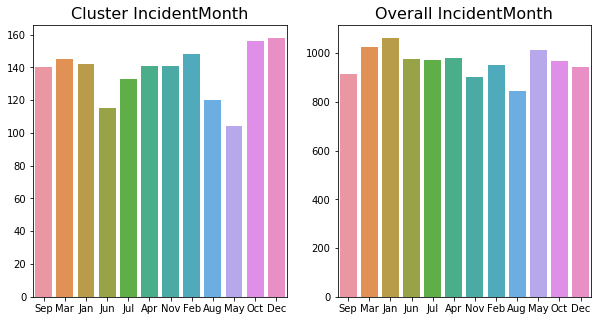

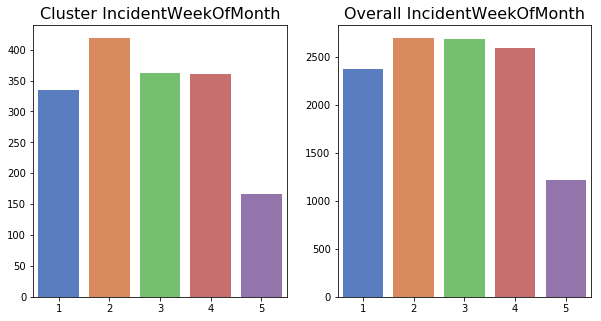

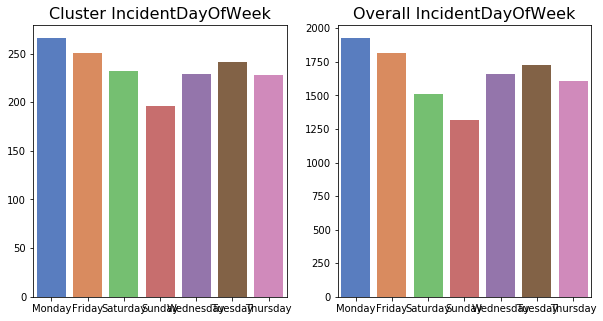

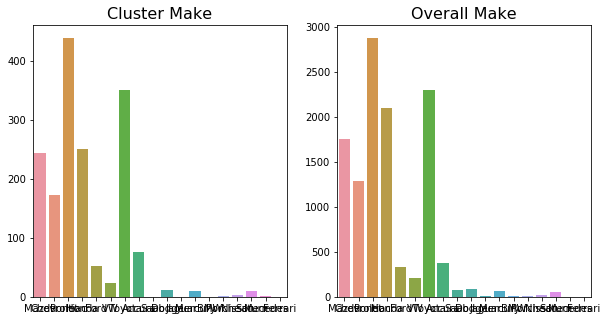

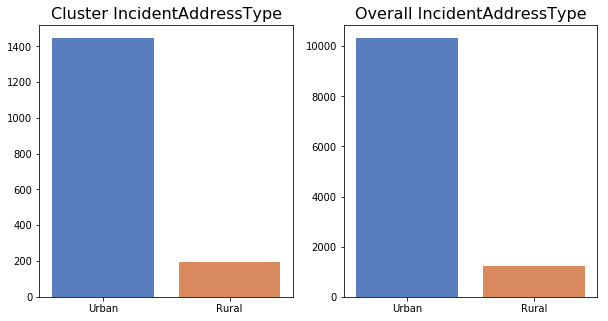

...

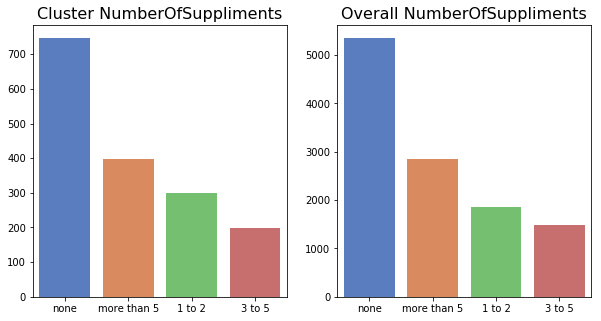

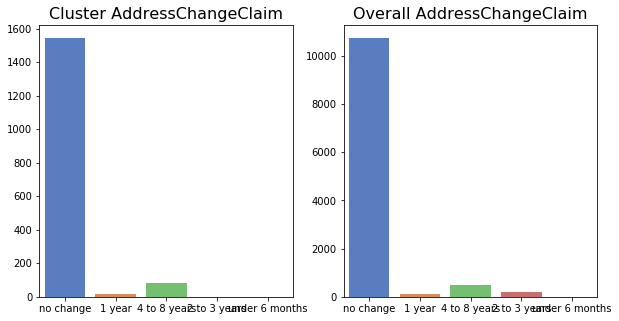

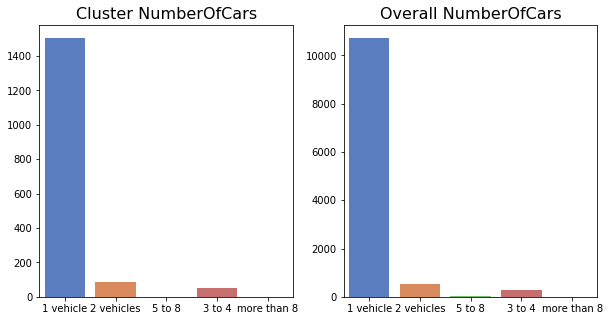

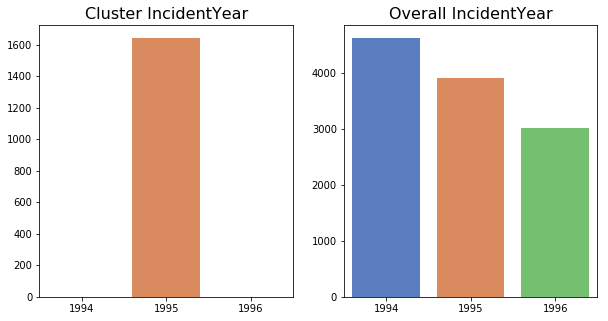

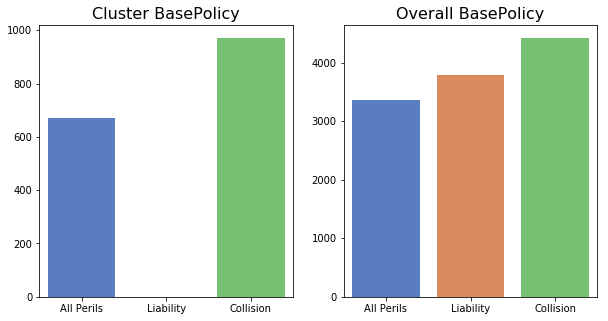

In [35]:
for column in raw_data.columns:
    compare_distribution(meanshift_fraud_cluster, column)

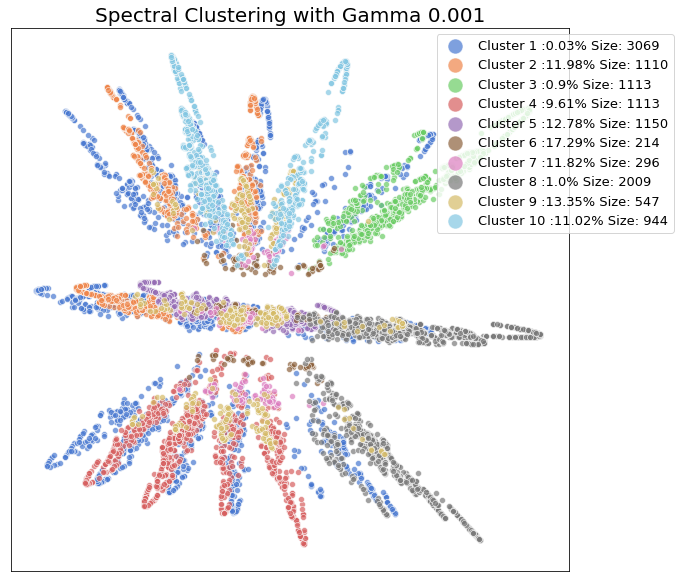

In [36]:
# Spectral Clustering

active = normalize(gradient_importance_weighted.drop('FraudFound', 1))
gamma = 0.001
num_clusters = 10

cluster_percents = []
score_df['Cluster'] = SpectralClustering(gamma=.001, n_clusters=num_clusters).fit_predict(active)
for cluster in range(len(score_df.Cluster.unique())):
    clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
    clus_len = len(score_df[score_df.Cluster == cluster])
    cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))
    
clusters = []
for i in range(num_clusters):
    clusters.append([]) 
for index in range(len(score_df)):
    for cluster in range(num_clusters):
        if score_df.Cluster[index] == cluster:
            clusters[cluster].append(index)

plt.figure(figsize=(10,10))
draw['Cluster'] = score_df.Cluster.copy()
for cluster in range(num_clusters):
    sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=0.7)
plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.title('Spectral Clustering with Gamma ' + str(gamma), fontsize=20)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

In [37]:
spectral_fraud_cluster = raw_data[score_df.Cluster == 9]
spectral_fraud_cluster

,IncidentMonth,IncidentWeekOfMonth,IncidentDayOfWeek,Make,IncidentAddressType,DeclarationDayOfWeek,DeclarationMonth,DeclarationWeekOfMonth,DriverGender,DriverMaritalStatus,DriverAge,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound,PolicyNumber,RepairerDetailID,Deductible,DriverRating,DaysPolicyAccident,DaysPolicyClaim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChangeClaim,NumberOfCars,IncidentYear,BasePolicy
46,Dec,2,Monday,Mazda,Urban,Monday,Dec,2,Male,Married,34,Policy Holder,Sedan - Collision,Sedan,30000 to 39000,0,6481,3,400,1,more than 30,more than 30,2 to 4,6 years,31 to 35,No,No,External,3 to 5,no change,1 vehicle,1995,Collision
72,Jun,3,Tuesday,Toyota,Urban,Tuesday,Jun,3,Male,Single,28,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,7658,3,400,2,more than 30,more than 30,1,3 years,31 to 35,No,No,External,none,no change,1 vehicle,1995,Collision
79,Jul,1,Saturday,Pontiac,Urban,Wednesday,Jan,2,Female,Single,31,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,8581,10,400,2,more than 30,more than 30,1,7 years,31 to 35,No,No,External,none,no change,1 vehicle,1995,Collision
88,Dec,2,Saturday,Pontiac,Urban,Friday,Dec,4,Female,Married,28,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,10137,7,400,4,more than 30,more than 30,2 to 4,6 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1995,Collision
92,May,5,Sunday,Toyota,Urban,Monday,May,5,Male,Married,45,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,6160,6,400,3,more than 30,more than 30,more than 4,7 years,36 to 40,No,No,External,none,no change,1 vehicle,1995,Collision
99,Dec,2,Monday,Chevrolet,Urban,Tuesday,Dec,3,Female,Married,47,Policy Holder,Sedan - All Perils,Sedan,30000 to 39000,0,9163,13,400,4,more than 30,more than 30,1,6 years,41 to 50,No,Yes,External,none,no change,1 vehicle,1995,All Perils
100,Apr,3,Thursday,Toyota,Urban,Friday,Apr,4,Male,Married,34,Policy Holder,Sedan - Collision,Sedan,30000 to 39000,0,10588,14,400,1,more than 30,more than 30,1,6 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1995,Collision
110,Aug,3,Wednesday,Toyota,Urban,Wednesday,Aug,3,Male,Married,55,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,6679,9,400,3,more than 30,more than 30,2 to 4,6 years,41 to 50,No,No,External,1 to 2,4 to 8 years,2 vehicles,1995,Collision
119,Aug,5,Monday,Toyota,Urban,Tuesday,Sep,2,Male,Married,41,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,9308,9,400,3,more than 30,more than 30,1,more than 7,36 to 40,No,No,External,more than 5,no change,3 to 4,1995,Collision
142,Jul,2,Saturday,Toyota,Urban,Monday,Jul,2,Male,Married,38,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,0,8860,10,400,4,more than 30,more than 30,2 to 4,7 years,36 to 40,No,No,External,more than 5,no change,1 vehicle,1995,Collision


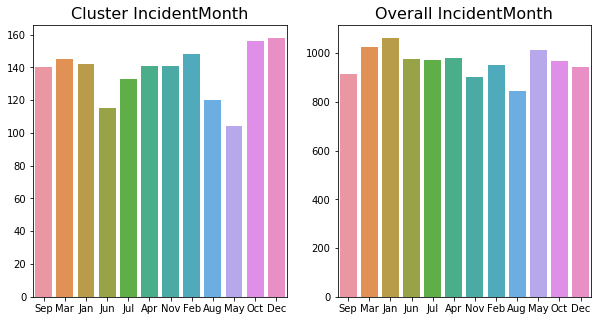

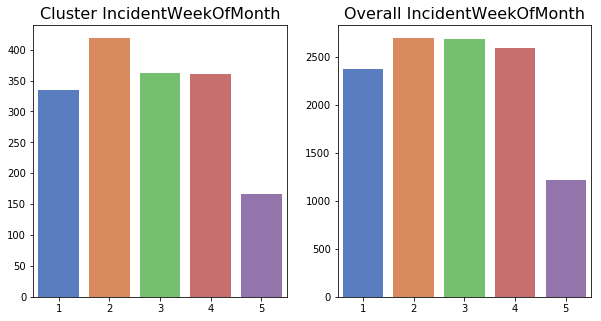

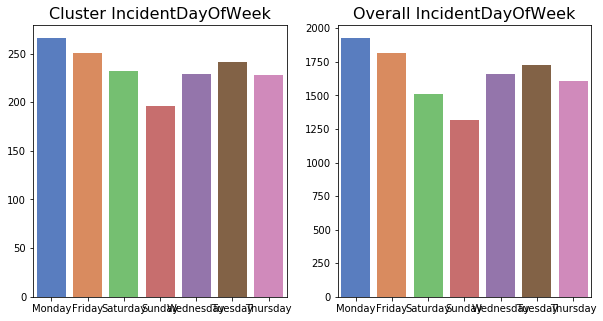

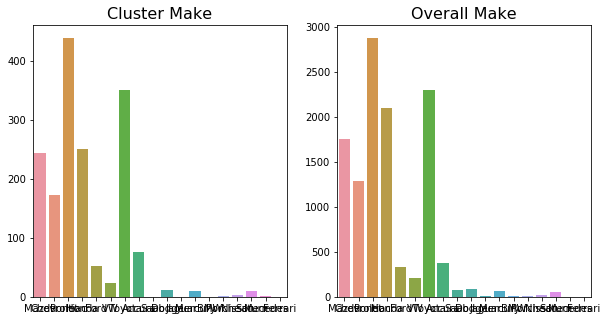

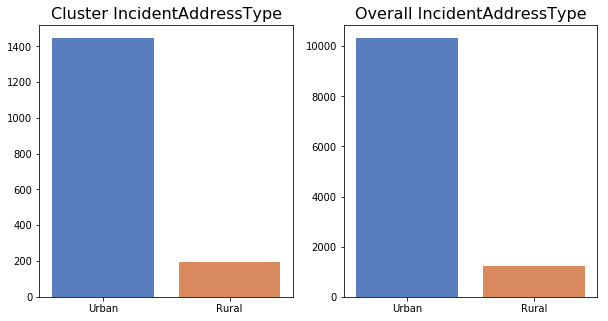

...

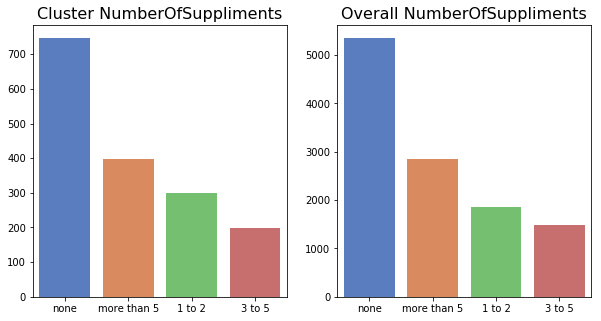

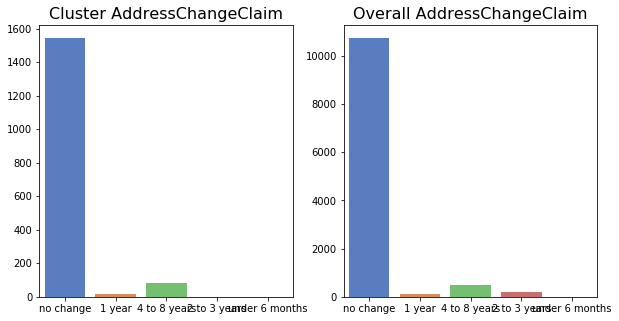

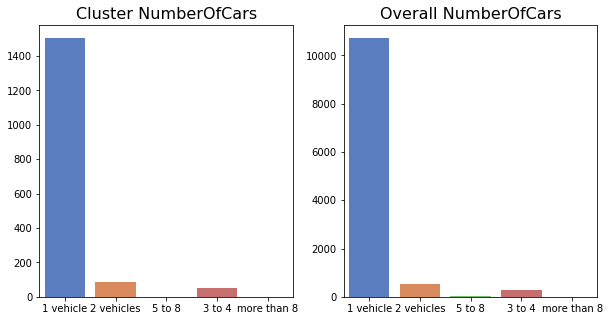

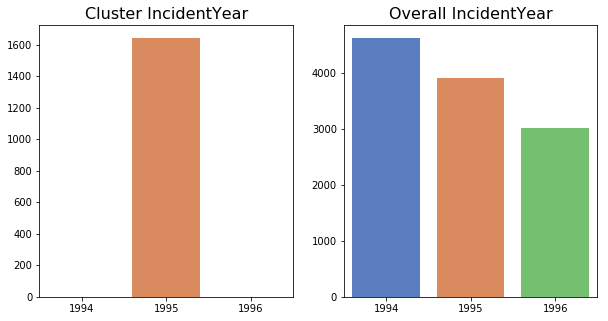

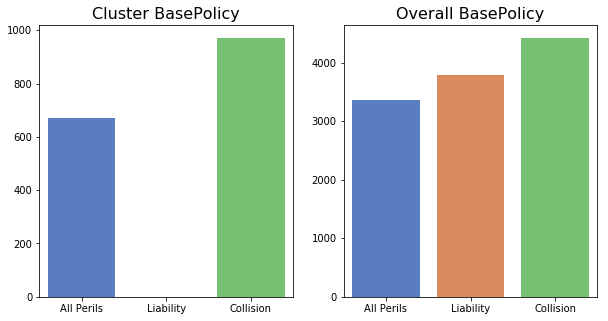

In [38]:
for column in raw_data.columns:
    compare_distribution(meanshift_fraud_cluster, column)

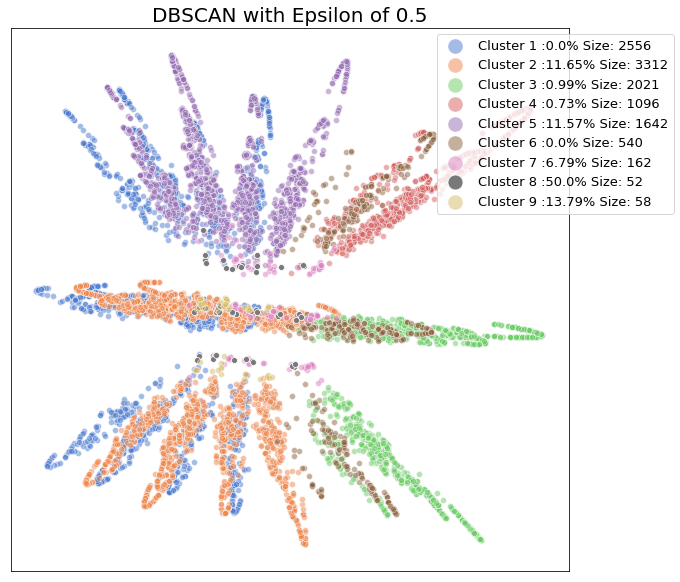

In [39]:
# DBSCAN

active = normalize(gradient_importance_weighted.drop('FraudFound', 1))
epsilon = .5
cluster_percents = []
score_df['Cluster'] = DBSCAN(eps=epsilon, min_samples = 30).fit_predict(active)
num_clusters = len(score_df.Cluster.unique())
for cluster in range(len(score_df.Cluster.unique())):
    clus_true = len(score_df[(score_df.Cluster == cluster) & (score_df.FraudFound == 1)])
    clus_len = len(score_df[score_df.Cluster == cluster])
    try:
        cluster_percents.append('Cluster ' + str(cluster + 1) + ' :' + str(round(100 * clus_true / clus_len, 2)) + '% Size: ' + str(clus_len))
    except:
        None
clusters = []
for i in range(num_clusters):
    clusters.append([]) 
for index in range(len(score_df)):
    for cluster in range(num_clusters):
        if score_df.Cluster[index] == cluster:
            clusters[cluster].append(index)

plt.figure(figsize=(10,10))
draw['Cluster'] = score_df.Cluster.copy()
for cluster in range(num_clusters):
    alp = 1 if cluster in [7] else 0.5
    sns.scatterplot('PCA 1', 'PCA 2', data=draw[draw.Cluster == cluster], alpha=alp)
    
plt.legend(cluster_percents, fontsize=13, markerscale=2.5, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.title('DBSCAN with Epsilon of ' + str(epsilon), fontsize=20)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

In [40]:
# Fraud Profiles
dbscan_fraud_cluster = raw_data[score_df.Cluster == 7]
dbscan_fraud_cluster

,IncidentMonth,IncidentWeekOfMonth,IncidentDayOfWeek,Make,IncidentAddressType,DeclarationDayOfWeek,DeclarationMonth,DeclarationWeekOfMonth,DriverGender,DriverMaritalStatus,DriverAge,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound,PolicyNumber,RepairerDetailID,Deductible,DriverRating,DaysPolicyAccident,DaysPolicyClaim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChangeClaim,NumberOfCars,IncidentYear,BasePolicy
188,Apr,5,Sunday,Pontiac,Urban,Tuesday,May,1,Male,Married,76,Third Party,Sedan - Collision,Sedan,20000 to 29000,0,3061,6,500,3,more than 30,more than 30,none,more than 7,over 65,No,No,External,none,2 to 3 years,1 vehicle,1994,Collision
309,Dec,1,Monday,Pontiac,Urban,Friday,Dec,2,Female,Single,27,Third Party,Sedan - Liability,Sport,30000 to 39000,0,6121,10,500,1,more than 30,more than 30,more than 4,7 years,31 to 35,No,No,External,more than 5,2 to 3 years,1 vehicle,1994,Liability
321,Aug,2,Monday,Toyota,Urban,Wednesday,Aug,2,Male,Single,22,Third Party,Sedan - Liability,Sport,20000 to 29000,0,9436,5,300,3,more than 30,more than 30,more than 4,5 years,26 to 30,No,No,External,none,2 to 3 years,1 vehicle,1995,Liability
1146,Nov,4,Tuesday,Pontiac,Urban,Wednesday,Nov,4,Female,Single,47,Third Party,Sedan - All Perils,Sedan,less than 20000,0,12853,11,500,1,more than 30,more than 30,1,more than 7,41 to 50,No,No,External,more than 5,2 to 3 years,2 vehicles,1996,All Perils
1152,Jul,4,Tuesday,Pontiac,Urban,Wednesday,Aug,1,Male,Married,61,Third Party,Sedan - All Perils,Sedan,20000 to 29000,0,10558,9,500,2,more than 30,more than 30,none,7 years,51 to 65,No,No,External,none,2 to 3 years,1 vehicle,1995,All Perils
1391,Feb,2,Wednesday,Pontiac,Urban,Thursday,Feb,2,Female,Married,45,Third Party,Sedan - Collision,Sedan,20000 to 29000,1,6988,1,500,2,more than 30,more than 30,none,6 years,36 to 40,No,No,External,1 to 2,2 to 3 years,1 vehicle,1995,Collision
1400,Mar,2,Friday,Pontiac,Urban,Thursday,Mar,4,Male,Single,46,Third Party,Sedan - Collision,Sedan,30000 to 39000,0,1939,1,500,1,more than 30,more than 30,more than 4,more than 7,41 to 50,No,No,External,none,2 to 3 years,1 vehicle,1994,Collision
1554,Nov,2,Wednesday,Toyota,Rural,Tuesday,Nov,4,Male,Married,58,Third Party,Sedan - Collision,Sedan,30000 to 39000,0,868,2,500,2,more than 30,more than 30,2 to 4,more than 7,51 to 65,No,No,External,3 to 5,2 to 3 years,1 vehicle,1994,Collision
1877,Dec,2,Wednesday,Honda,Urban,Friday,Dec,3,Male,Married,29,Third Party,Sedan - Collision,Sedan,20000 to 29000,1,9691,13,300,1,more than 30,more than 30,none,4 years,31 to 35,No,No,External,none,2 to 3 years,1 vehicle,1995,Collision
2216,Feb,3,Tuesday,Honda,Urban,Friday,Feb,3,Male,Married,31,Third Party,Sedan - Collision,Sedan,20000 to 29000,1,14128,6,500,4,more than 30,more than 30,more than 4,6 years,31 to 35,No,No,External,none,2 to 3 years,1 vehicle,1996,Collision


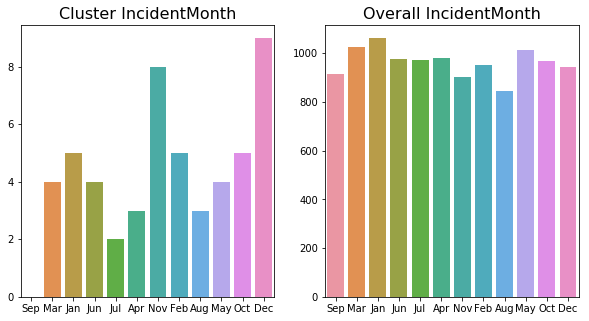

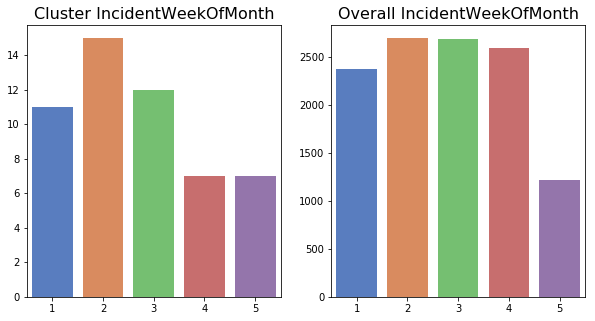

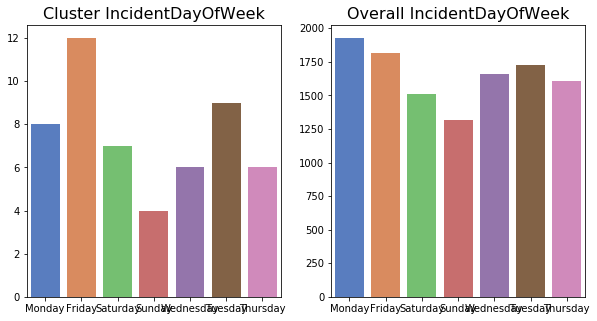

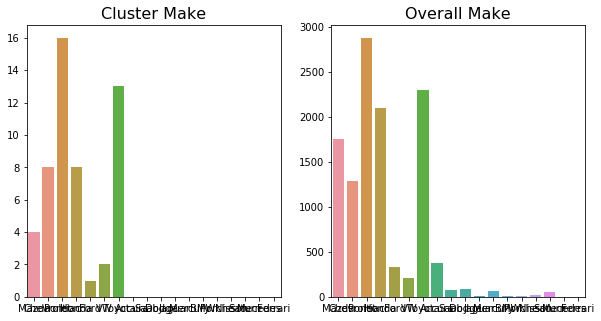

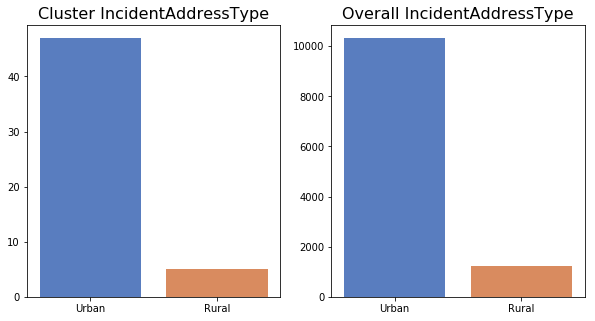

...

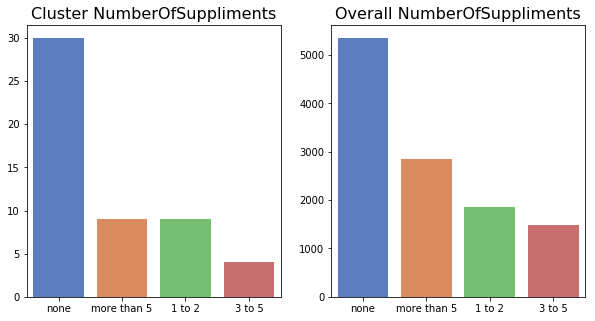

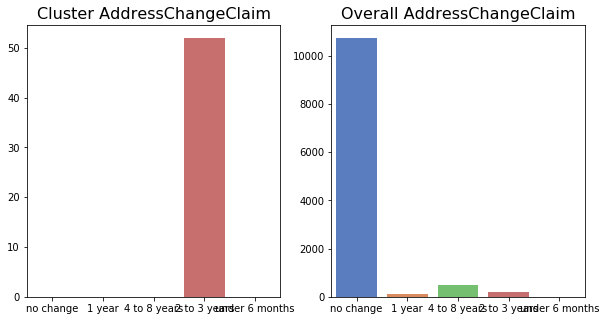

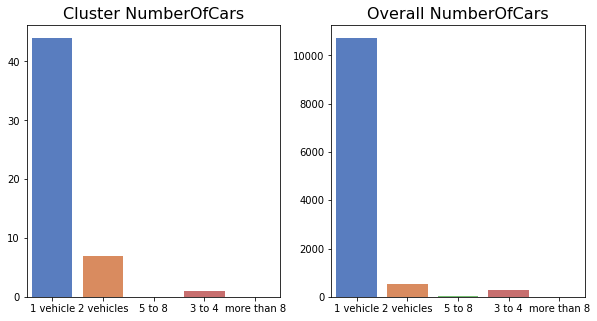

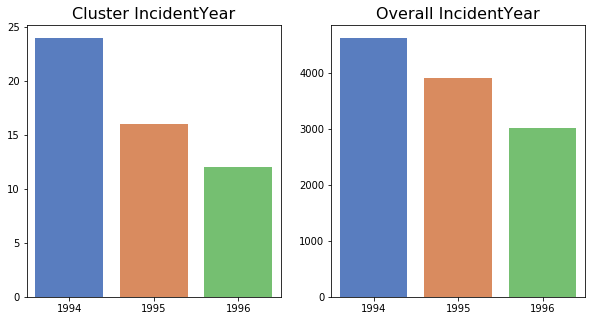

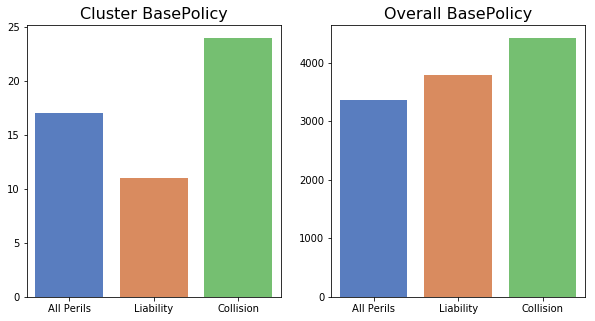

In [41]:
for column in raw_data.columns:
    compare_distribution(dbscan_fraud_cluster, column)

In [52]:
raw_data.columns

Index(['IncidentMonth', 'IncidentWeekOfMonth', 'IncidentDayOfWeek', 'Make',
       'IncidentAddressType', 'DeclarationDayOfWeek', 'DeclarationMonth',
       'DeclarationWeekOfMonth', 'DriverGender', 'DriverMaritalStatus',
       'DriverAge', 'Fault', 'PolicyType', 'VehicleCategory', 'VehiclePrice',
       'FraudFound', 'PolicyNumber', 'RepairerDetailID', 'Deductible',
       'DriverRating', 'DaysPolicyAccident', 'DaysPolicyClaim',
       'PastNumberOfClaims', 'AgeOfVehicle', 'AgeOfPolicyHolder',
       'PoliceReportFiled', 'WitnessPresent', 'AgentType',
       'NumberOfSuppliments', 'AddressChangeClaim', 'NumberOfCars',
       'IncidentYear', 'BasePolicy'],
      dtype='object')

In [63]:
# Percent of fraud with 500 Deductible, 2-3 year address change, 3rd party fault, Sedan: 62%
x = len(raw_data[(raw_data.Deductible == 500) & (raw_data.FraudFound == 1) & (raw_data.AddressChangeClaim == '2 to 3 years') & (raw_data.Fault == 'Third Party') & (raw_data.VehicleCategory == 'Sedan')])
y = len(raw_data[(raw_data.Deductible == 500) & (raw_data.FraudFound == 0) & (raw_data.AddressChangeClaim == '2 to 3 years') & (raw_data.Fault == 'Third Party') & (raw_data.VehicleCategory == 'Sedan')])

x/(x + y)

0.6216216216216216

In [64]:
# If we take away 2 - 3 year address change, we still have 0.6
x = len(raw_data[(raw_data.Deductible == 500) & (raw_data.FraudFound == 1) & (raw_data.Fault == 'Third Party') & (raw_data.VehicleCategory == 'Sedan')])
y = len(raw_data[(raw_data.Deductible == 500) & (raw_data.FraudFound == 0) & (raw_data.Fault == 'Third Party') & (raw_data.VehicleCategory == 'Sedan')])

x/(x + y)

0.6

Across clustering techniques, we see 2 important recurring features of high-fraud clusters: 2 - 3 year change of address and 500 deductible. Our DBSCAN clustering model is finding the best cluster of size 52 with 50% fraud. Beyond those two features, this cluster is also 100% 3rd party fault and has a higher density of sedans. There exits some colinearity between my features. Every claim with a 500 deductible also has a 2 - 3 year change of address, and we can simplify the profile further.

I propose the following final profile that should be investigated for fraud:

1. 2 - 3 year change of address
2. 3rd party fault
3. Sedan

With more data collection, this model could be increased in strength greatly. More important than amount of labeled cases are number of variables or features. Gather as much information about the insurance claims as possible. In general, time-related variables seem to have almost no connection to fraud, demographic variables seem to have low importance as well. Aspects of the policy such as deductible and time since last address change seem to be the most important. This gives clues as to what kinds of variables to track in the future. An easy first step would be to understand what factors result in a 500 deductible and 2-3 year address change.

Claims will also have to be randomly investigated to produce labels for model training. With enough useful features, a supervised learning model will become more useful than clustering, since clustering is limited in polynomial computational time. Supervised learning models such as the neural network used here have better recall than the solutions that clustering techniques use, which will be better for a final product.